In [1]:
import inspect
import warnings

warnings.filterwarnings("ignore")

import umap
from pmlb import fetch_data  # , classification_dataset_names
from scipy.stats import entropy, mannwhitneyu
from seaborn import scatterplot
from sklearn.model_selection import train_test_split

from gower.gower_dist import *

pd.options.display.float_format = '{:.6f}'.format

plt.style.use("dark_background")

optimize = optimize_agglo

### This is a battery of tests to see how well various clustering evaluation metrics perform on a variety of datasets.

The datasets are all from the Penn Machine Learning Benchmark.

Each dataset is capped at 1,000 rows (stratified `train_test_split` with `random_state=42`).

The target variable is either binary or categorical.

### Dataset Selection:

All datasets were run through the `optimize_agglo` function with the default parameters.

If the maximum possible Gini-weighted average of Adjusted Mutual Information and Adjusted Rand Index across the grid of distance threshold values were greater than 0.4, the dataset was included in the analysis.

  0%|          | 0/22 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

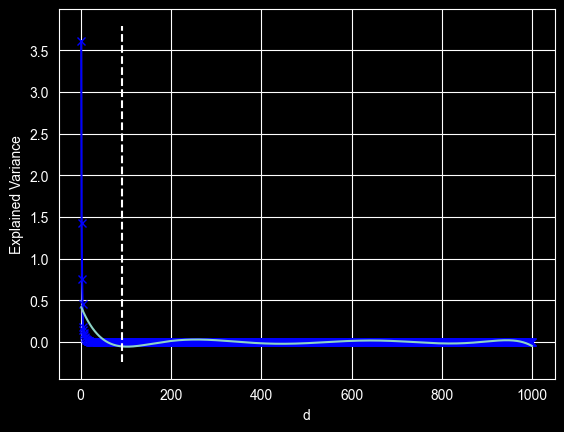

  0%|          | 0/100 [00:00<?, ?it/s]

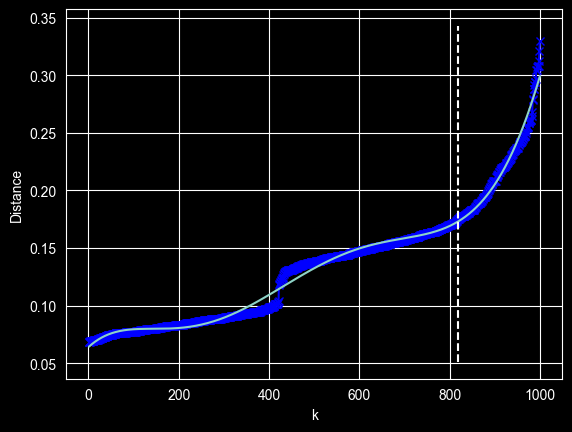

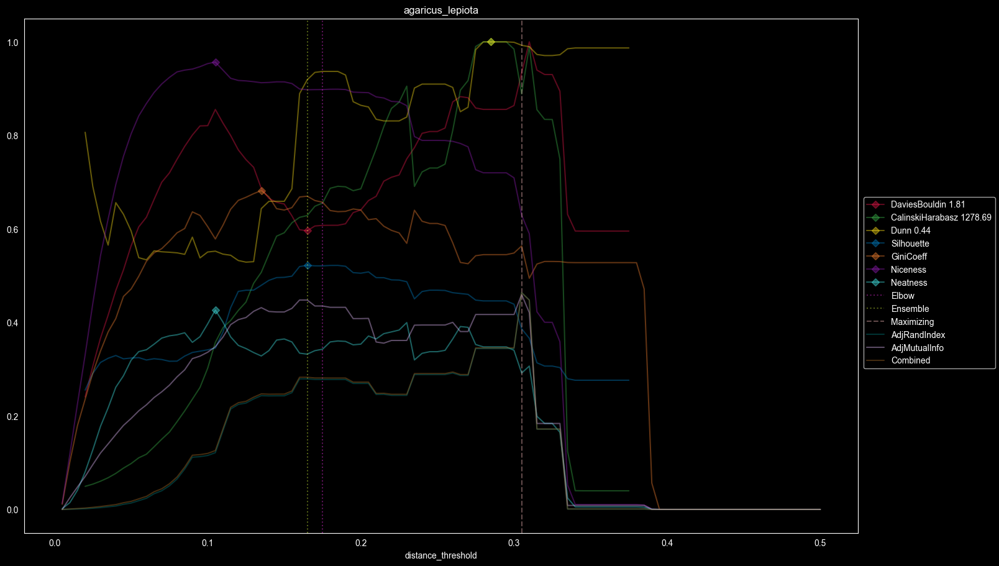

{'Silhouette': 0.3803645821846372, 'Niceness': 0.6198312769715347, 'GiniCoeff': 0.5775526526259664, 'Neatness': 0.27934729831084937, 'sample': {'distance_threshold': 0.305, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {5: 1, 19: 1, 172: 1, 225: 1, 579: 1}, 'DaviesBouldin': 1.690466978414896, 'CalinskiHarabasz': 1092.7385137352796, 'Dunn': 0.43766185020989407, 'AdjRandIndex': 0.463652015896542, 'AdjMutualInfo': 0.45961611413335485, 'Combined': 0.4635702434268}
0    519
1    481
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.447873      0.279261  0.282677
CalinskiHarabasz       0.416945      0.344005  0.345483
Dunn                   0.416945      0.344005  0.345483
Silhouette             0.447873      0.279261  0.282677
GiniCoeff              0.431592      0.243301  0.247116
Niceness               0.348069

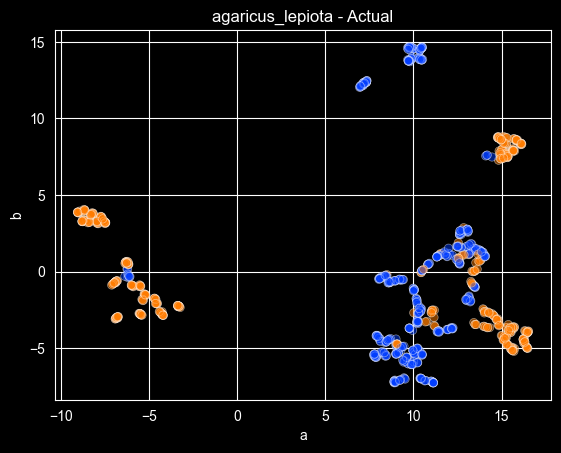

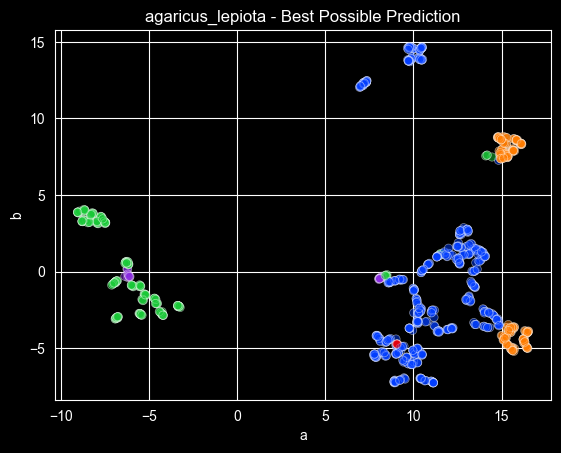

Dataset Summary
n   1000.000000
d     22.000000
k      2.000000
e      0.692425
g      0.020261
Name: agaricus_lepiota, dtype: float64


  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/841 [00:00<?, ?it/s]

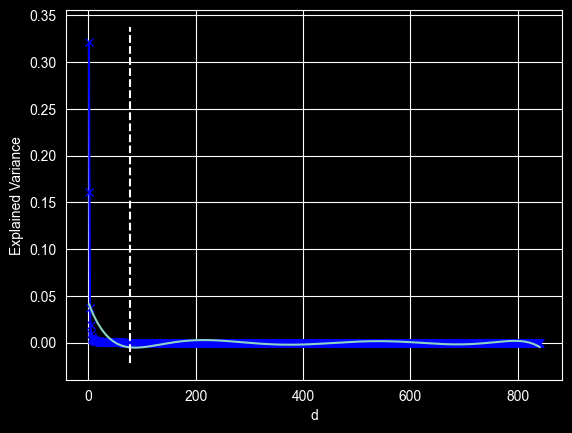

  0%|          | 0/100 [00:00<?, ?it/s]

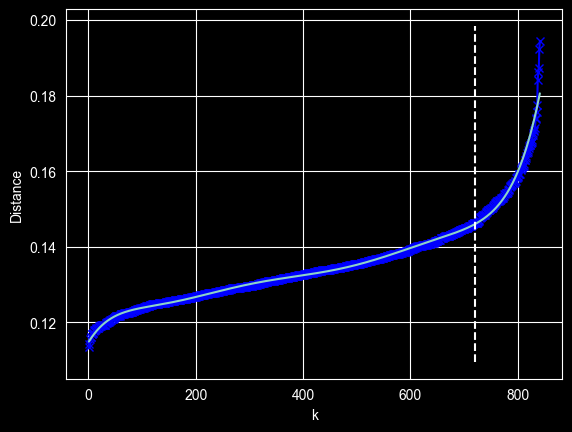

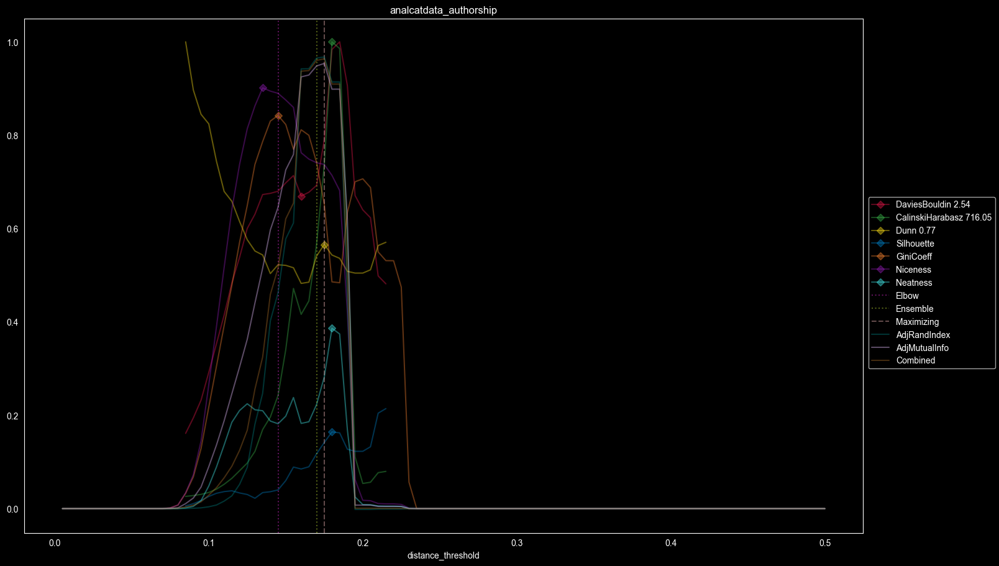

{'Silhouette': 0.141266431462078, 'Niceness': 0.7405702259780766, 'GiniCoeff': 0.665656887755102, 'Neatness': 0.27424024985517165, 'sample': {'distance_threshold': 0.175, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 3: 2, 4: 1, 55: 1, 174: 1, 287: 1, 314: 1}, 'DaviesBouldin': 1.9711972734826262, 'CalinskiHarabasz': 515.380612916275, 'Dunn': 0.44209489504940364, 'AdjRandIndex': 0.9676308175806052, 'AdjMutualInfo': 0.9537722960884977, 'Combined': 0.9636137907833073}
0    317
1    296
3    173
2     55
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.924989      0.942101  0.937141
CalinskiHarabasz       0.898647      0.914010  0.909557
Dunn                   0.953772      0.967631  0.963614
Silhouette             0.898647      0.914010  0.909557
GiniCoeff              0.645835      0.462356  0.515539
N

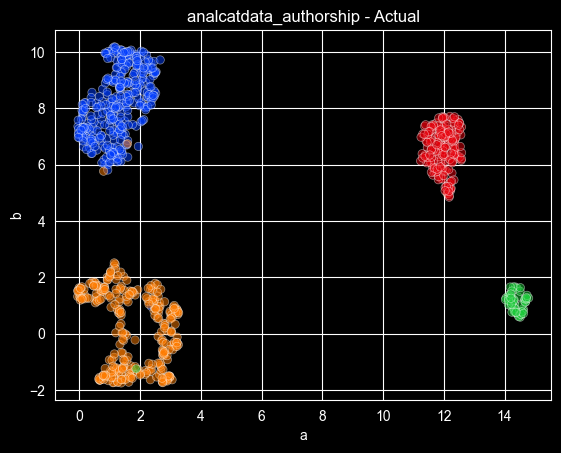

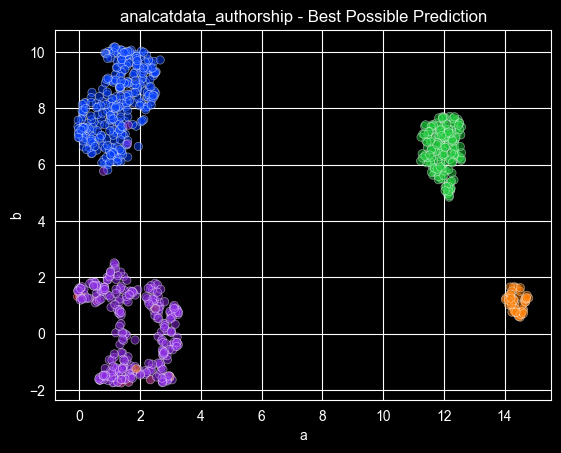

Dataset Summary
n   841.000000
d    70.000000
k     4.000000
e     1.238942
g     0.289860
Name: analcatdata_authorship, dtype: float64


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/699 [00:00<?, ?it/s]

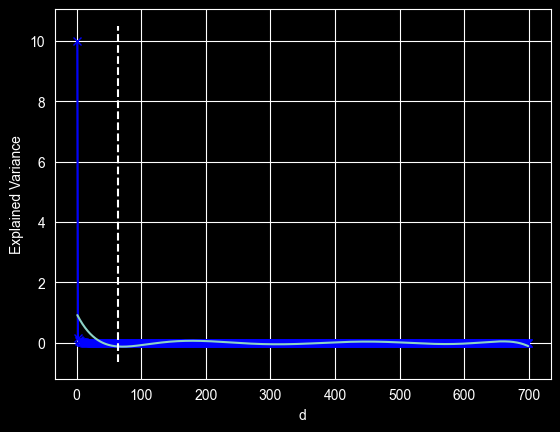

  0%|          | 0/100 [00:00<?, ?it/s]

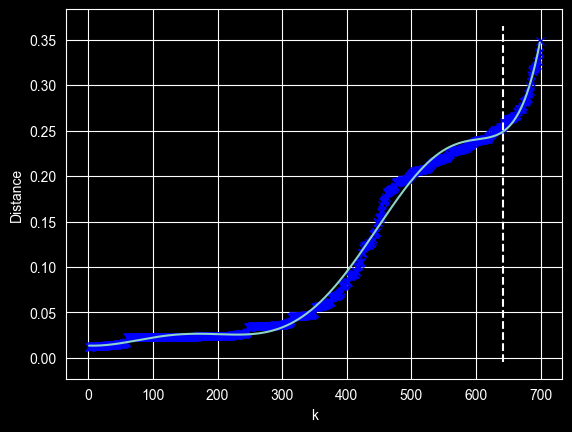

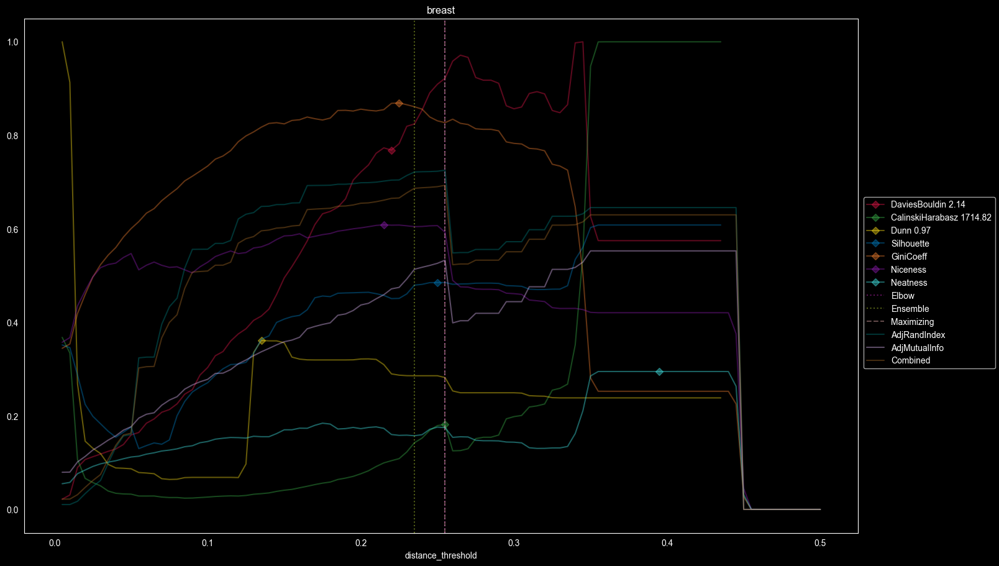

{'Silhouette': 0.4858914858407512, 'Niceness': 0.606714140595063, 'GiniCoeff': 0.8252005943536405, 'Neatness': 0.17809807647149623, 'sample': {'distance_threshold': 0.255, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 1, 3: 1, 4: 3, 7: 1, 10: 1, 14: 1, 19: 1, 27: 1, 28: 1, 63: 1, 69: 1, 444: 1}, 'DaviesBouldin': 1.9655248596307482, 'CalinskiHarabasz': 327.581529010583, 'Dunn': 0.27669751594223757, 'AdjRandIndex': 0.7254323575747712, 'AdjMutualInfo': 0.5330655880233846, 'Combined': 0.6931787672684139}
0    458
1    241
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.471694      0.704267  0.665272
CalinskiHarabasz       0.533066      0.725432  0.693179
Dunn                   0.337075      0.647917  0.595799
Silhouette             0.526313      0.723231  0.690214
GiniCoeff              0.474854     

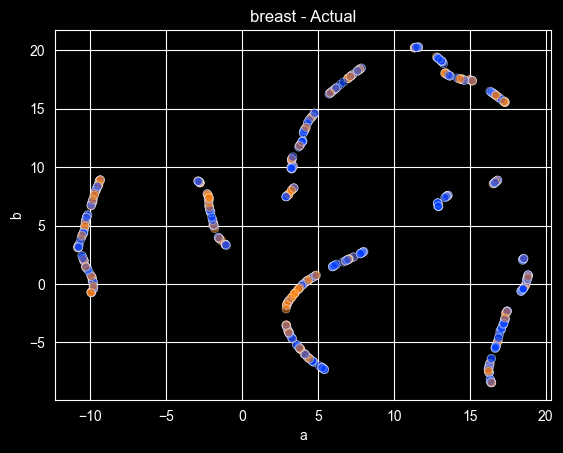

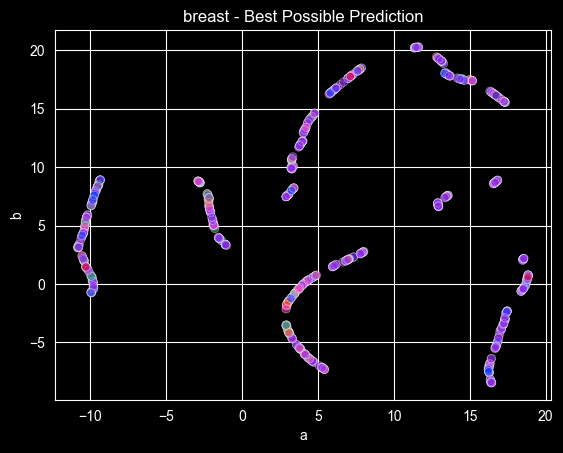

Dataset Summary
n   699.000000
d    10.000000
k     2.000000
e     0.644154
g     0.167667
Name: breast, dtype: float64


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/569 [00:00<?, ?it/s]

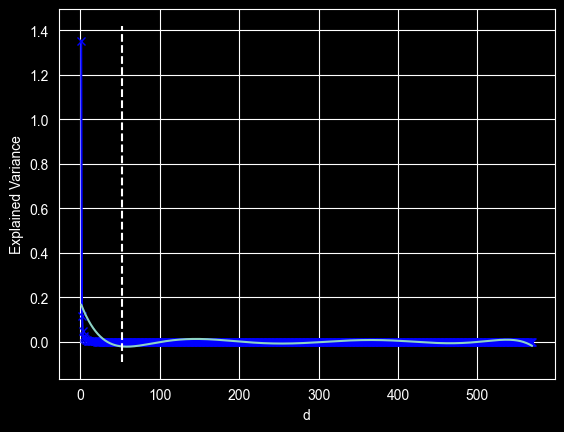

  0%|          | 0/100 [00:00<?, ?it/s]

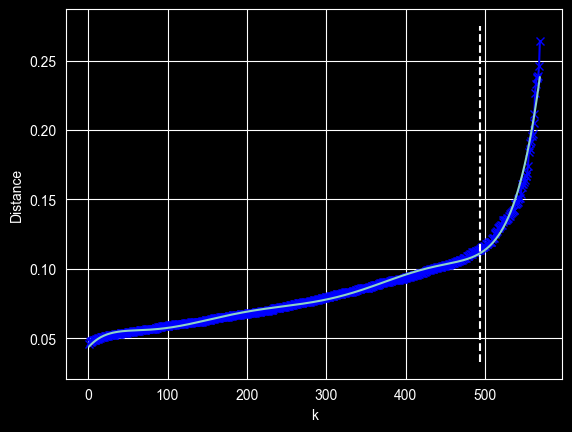

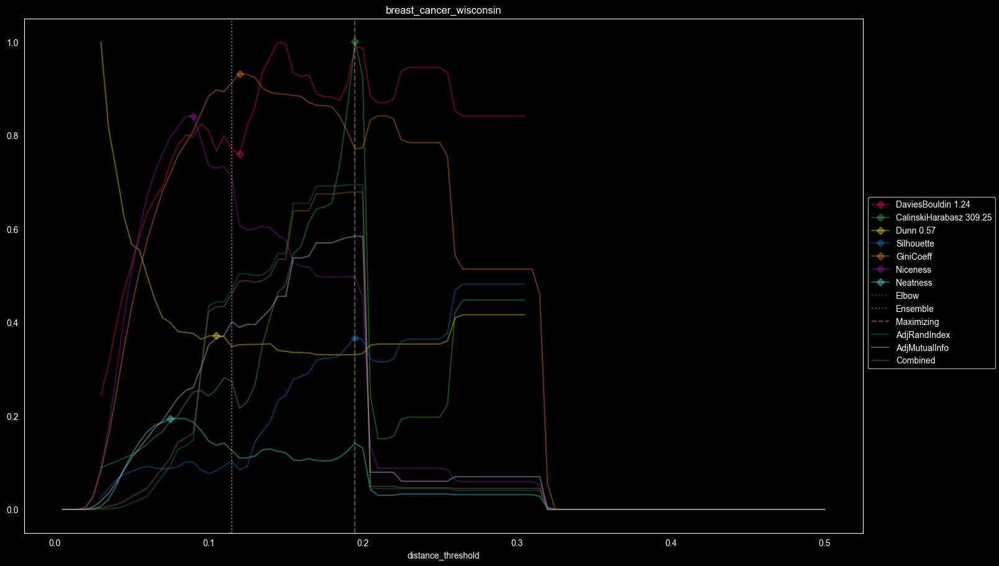

{'Silhouette': 0.3689079924186501, 'Niceness': 0.49835139389421224, 'GiniCoeff': 0.7655364978061427, 'Neatness': 0.14349770323387787, 'sample': {'distance_threshold': 0.195, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 4: 2, 15: 1, 160: 1, 385: 1}, 'DaviesBouldin': 1.2450339208594108, 'CalinskiHarabasz': 314.80553610784114, 'Dunn': 0.18714400725304445, 'AdjRandIndex': 0.6941464166407882, 'AdjMutualInfo': 0.5841595262643937, 'Combined': 0.6788789902941647}
0    357
1    212
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.389304      0.504053  0.488124
CalinskiHarabasz       0.584160      0.694146  0.678879
Dunn                   0.366554      0.443903  0.433166
Silhouette             0.584160      0.694146  0.678879
GiniCoeff              0.389304      0.504053  0.488124
Niceness               0.260

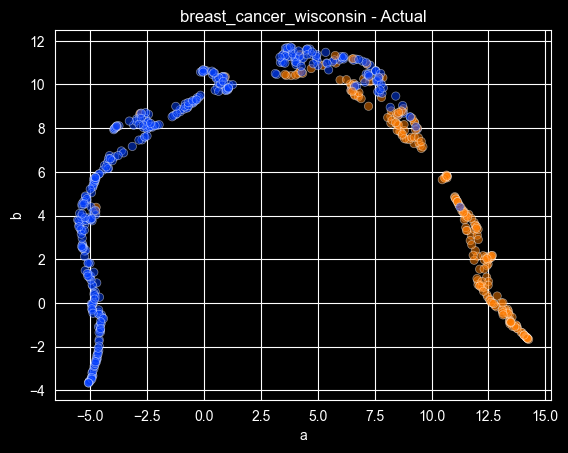

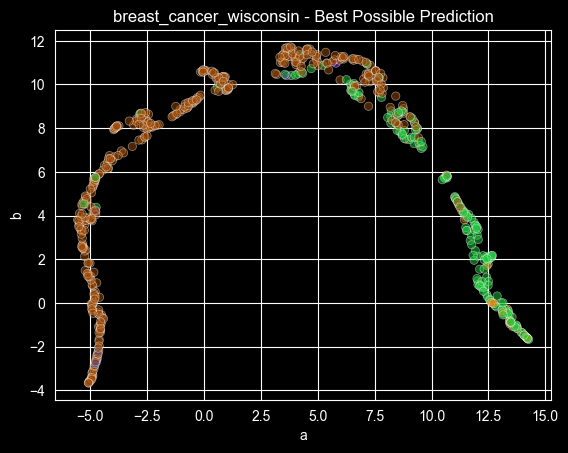

Dataset Summary
n   569.000000
d    30.000000
k     2.000000
e     0.660316
g     0.138811
Name: breast_cancer_wisconsin, dtype: float64


  0%|          | 0/23 [00:00<?, ?it/s]

  0%|          | 0/485 [00:00<?, ?it/s]

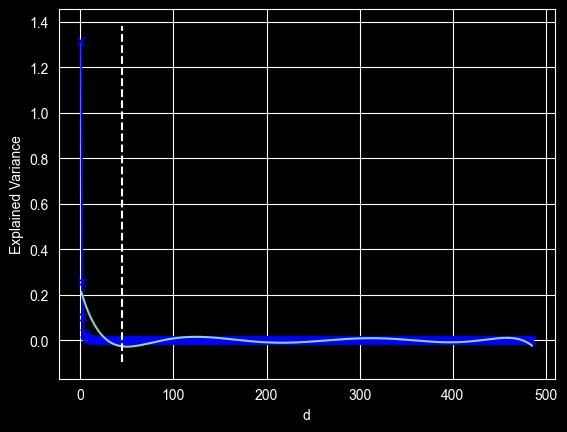

  0%|          | 0/100 [00:00<?, ?it/s]

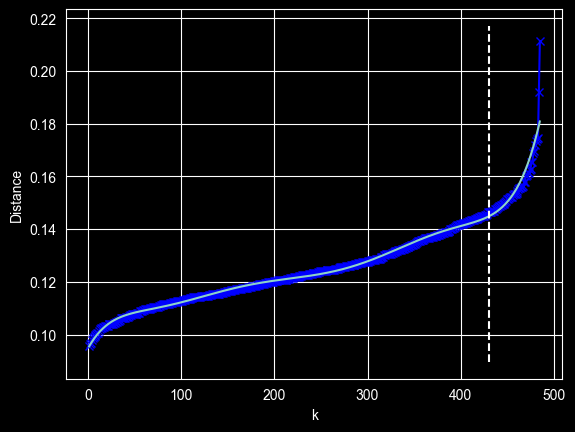

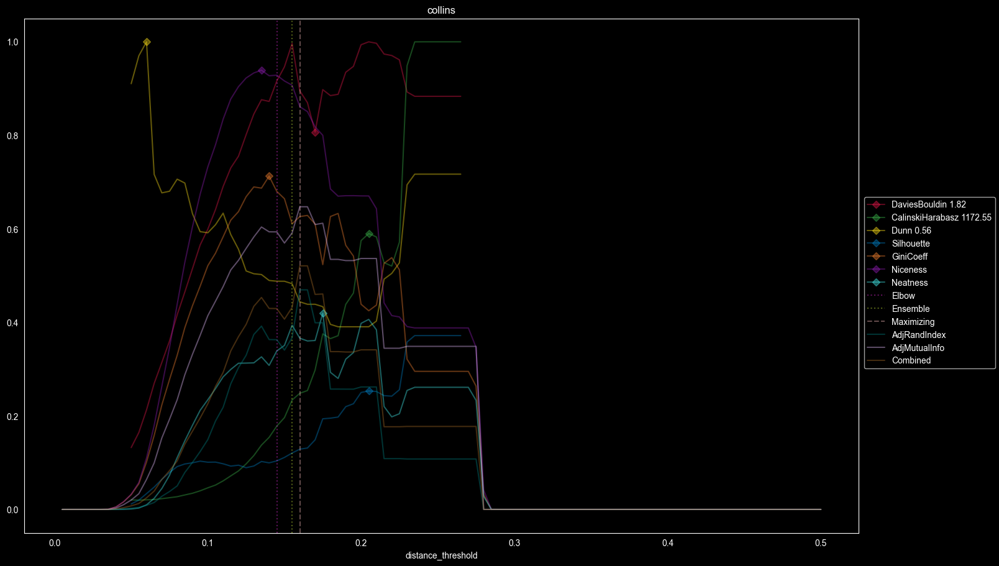

{'Silhouette': 0.1297931609339418, 'Niceness': 0.8551379381712955, 'GiniCoeff': 0.6294353594569577, 'Neatness': 0.3615494418716325, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 3, 5: 1, 45: 1, 104: 1, 105: 1, 107: 1, 111: 1}, 'DaviesBouldin': 1.6003553698470796, 'CalinskiHarabasz': 292.71326362717093, 'Dunn': 0.24507797237279713, 'AdjRandIndex': 0.46959911743271227, 'AdjMutualInfo': 0.6472800005507138, 'Combined': 0.5209358040478707}
8     80
6     75
5     48
0     44
4     36
7     30
9     29
12    29
13    29
1     27
10    24
2     17
3     17
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.609273      0.399133  0.459848
CalinskiHarabasz       0.536659      0.261915  0.341296
Dunn                   0.064075      0.008804  0.024773
Silhouette           

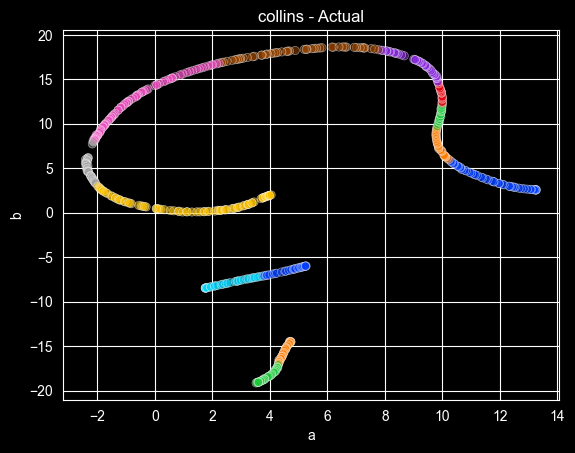

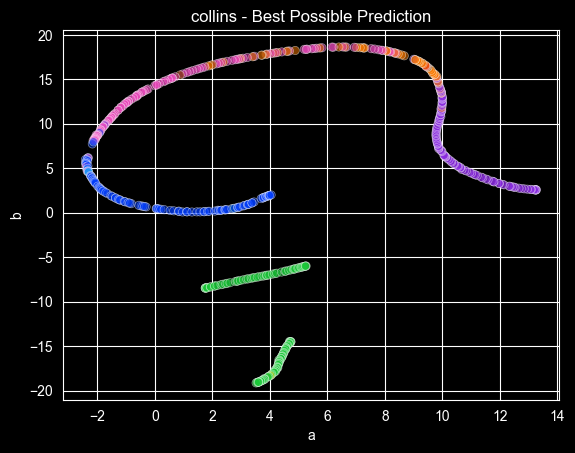

Dataset Summary
n   485.000000
d    23.000000
k    13.000000
e     2.447482
g     0.288926
Name: collins, dtype: float64


  0%|          | 0/3 [00:00<?, ?it/s]

  0%|          | 0/72 [00:00<?, ?it/s]

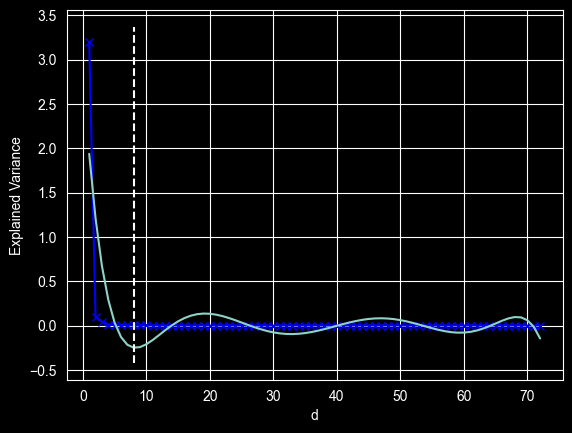

  0%|          | 0/100 [00:00<?, ?it/s]

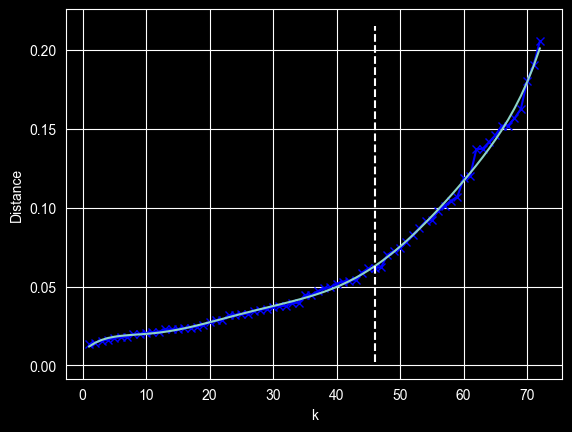

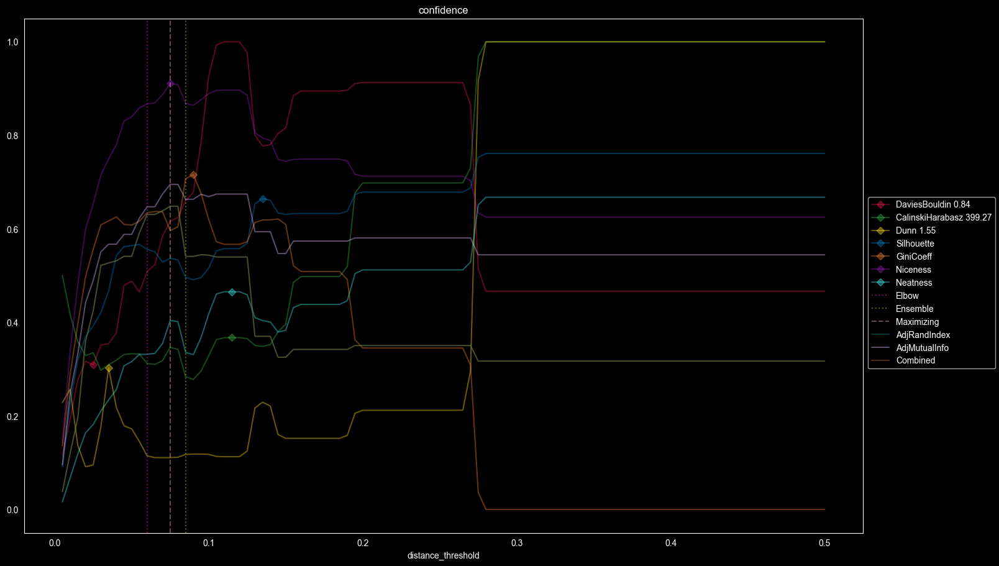

{'Silhouette': 0.5386730561899363, 'Niceness': 0.9137455908289241, 'GiniCoeff': 0.5906593406593407, 'Neatness': 0.4107435035971563, 'sample': {'distance_threshold': 0.075, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 4, 2: 1, 3: 1, 4: 2, 6: 1, 11: 1, 12: 1, 13: 2}, 'DaviesBouldin': 0.5205787181220363, 'CalinskiHarabasz': 139.88495411558281, 'Dunn': 0.17223285578337502, 'AdjRandIndex': 0.6483521570079614, 'AdjMutualInfo': 0.6951089231986718, 'Combined': 0.6483521570079614}
0    12
4    12
2    12
1    12
5    12
3    12
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.489752      0.425168  0.425168
CalinskiHarabasz       0.674343      0.539837  0.539837
Dunn                   0.567411      0.527009  0.527009
Silhouette             0.593935      0.370235  0.370235
GiniCoeff              0.663285      0.5

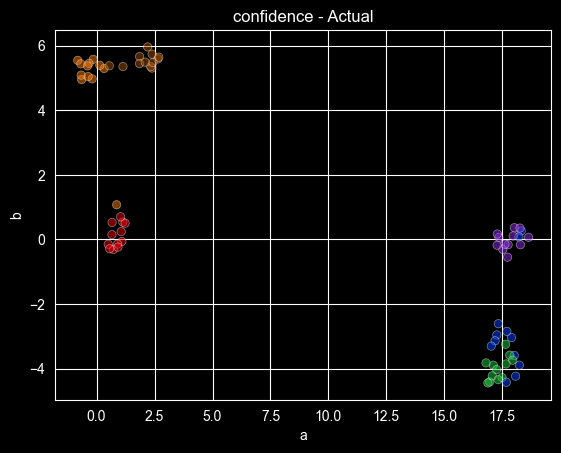

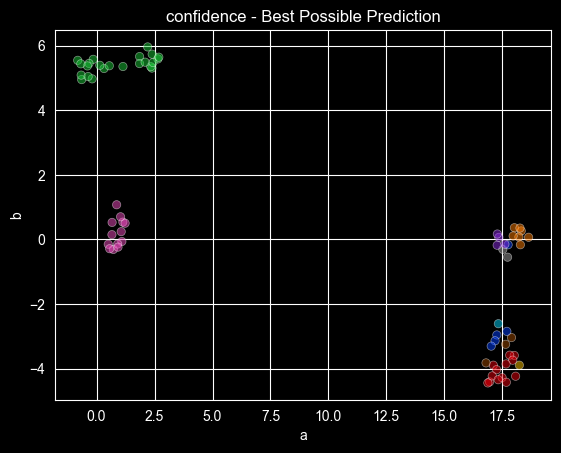

Dataset Summary
n   72.000000
d    3.000000
k    6.000000
e    1.791759
g    0.000000
Name: confidence, dtype: float64


  0%|          | 0/34 [00:00<?, ?it/s]

  0%|          | 0/366 [00:00<?, ?it/s]

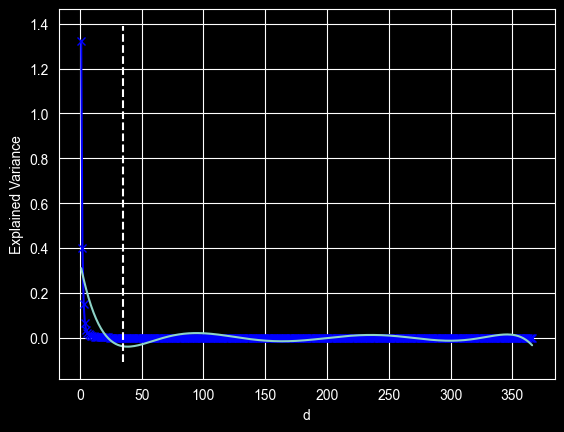

  0%|          | 0/100 [00:00<?, ?it/s]

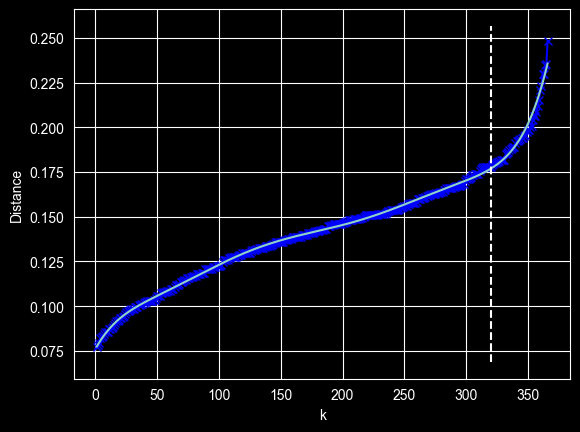

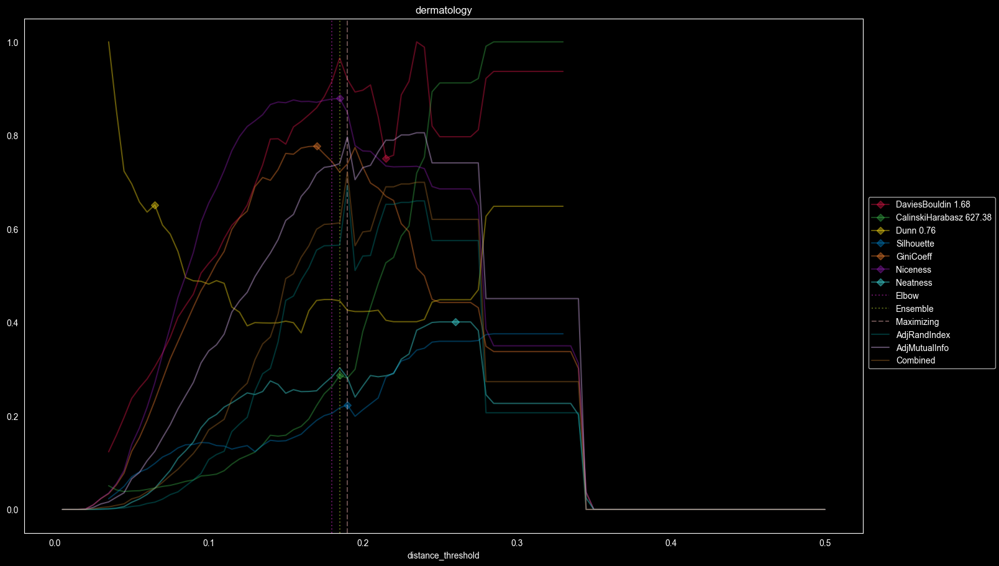

{'Silhouette': 0.22819660440245307, 'Niceness': 0.8556956315243281, 'GiniCoeff': 0.735745543814708, 'Neatness': 0.28510730979280263, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 2, 3: 1, 4: 1, 6: 1, 7: 1, 9: 2, 10: 1, 51: 1, 70: 1, 80: 1, 111: 1}, 'DaviesBouldin': 1.5366227802077495, 'CalinskiHarabasz': 174.61750623810357, 'Dunn': 0.32157865740385877, 'AdjRandIndex': 0.6931234679028697, 'AdjMutualInfo': 0.7965376419461051, 'Combined': 0.7213308456131363}
1    112
3     72
2     61
5     52
4     49
6     20
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.789748      0.652587  0.689999
CalinskiHarabasz       0.739610      0.565295  0.612841
Dunn                   0.124311      0.015532  0.045203
Silhouette             0.796538      0.693123  0.721331
GiniCoe

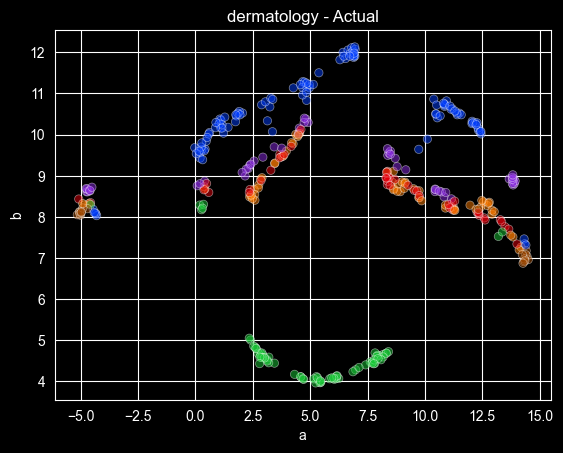

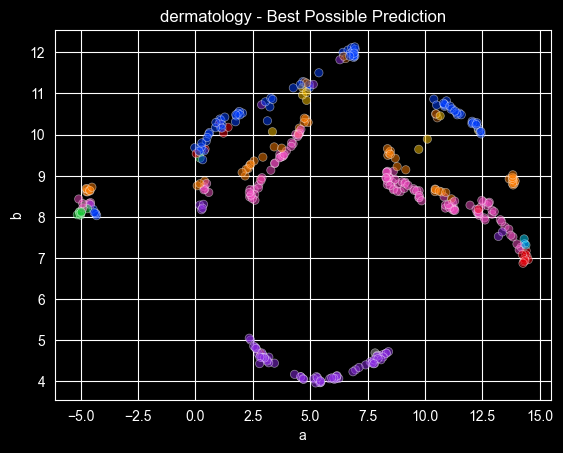

Dataset Summary
n   366.000000
d    34.000000
k     6.000000
e     1.686148
g     0.272761
Name: dermatology, dtype: float64


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/327 [00:00<?, ?it/s]

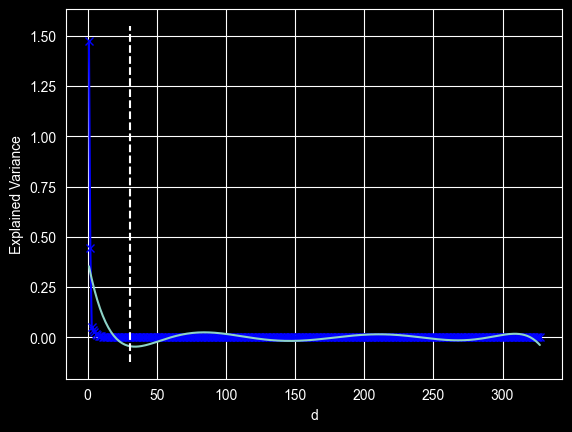

  0%|          | 0/100 [00:00<?, ?it/s]

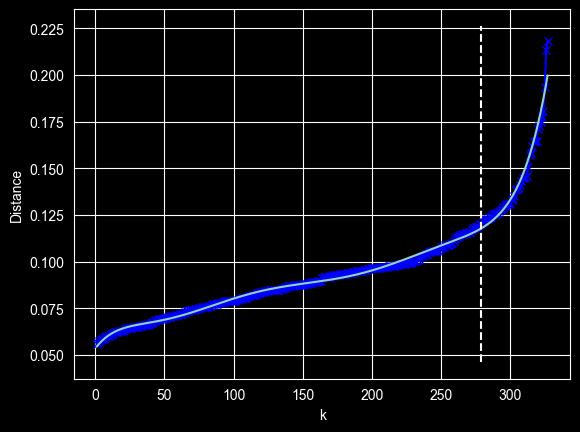

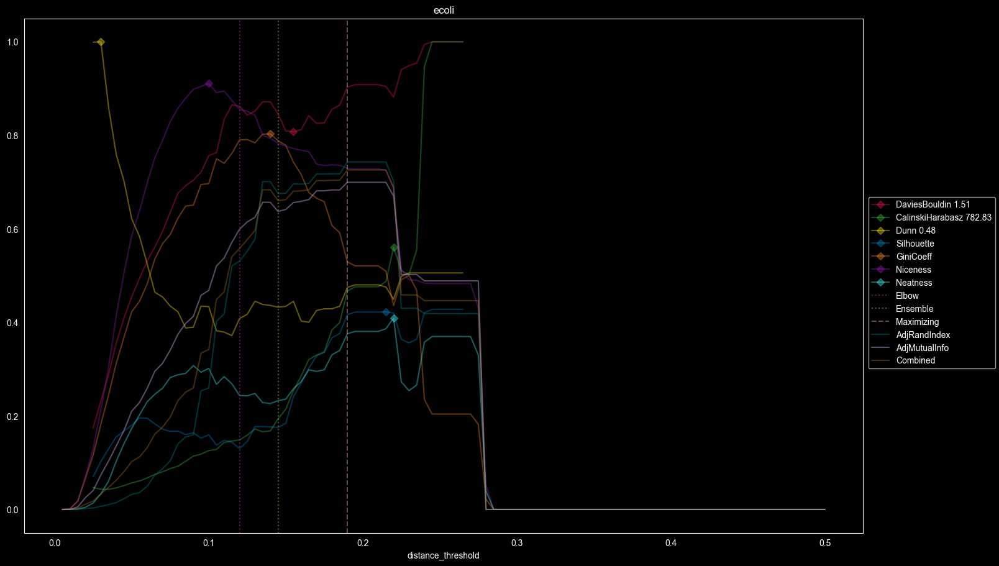

{'Silhouette': 0.4219515007893117, 'Niceness': 0.7279824810860065, 'GiniCoeff': 0.520845231296402, 'Neatness': 0.3806425326804621, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {2: 1, 8: 1, 69: 1, 104: 1, 144: 1}, 'DaviesBouldin': 1.3719569329244137, 'CalinskiHarabasz': 372.7750429342168, 'Dunn': 0.23169941003424477, 'AdjRandIndex': 0.7431364403991227, 'AdjMutualInfo': 0.6996032526550023, 'Combined': 0.7259518947859097}
0    143
1     77
7     52
4     35
5     20
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.656236      0.696324  0.680499
CalinskiHarabasz       0.670060      0.700950  0.688756
Dunn                   0.073976      0.006613  0.033204
Silhouette             0.699603      0.743136  0.725952
GiniCoeff              0.656778      0.701042  0.683569
Nicene

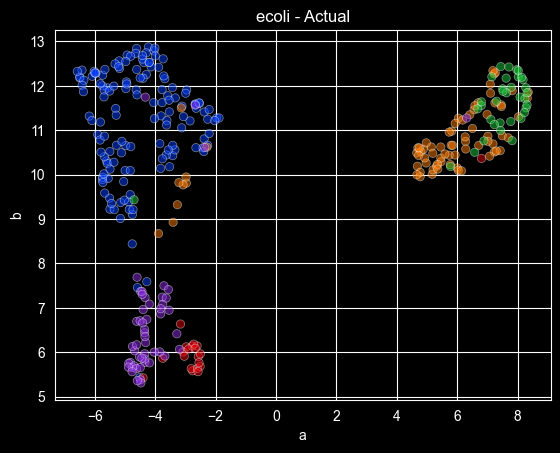

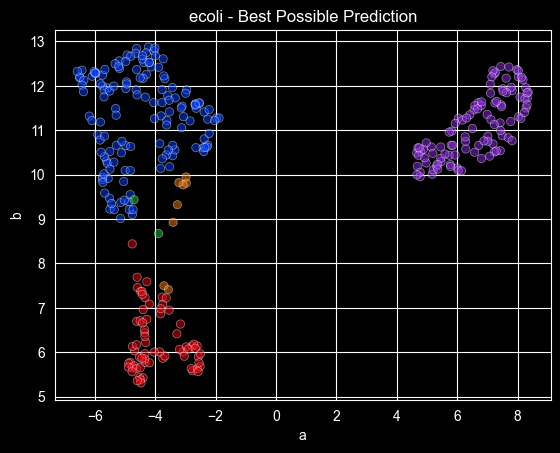

Dataset Summary
n   327.000000
d     7.000000
k     5.000000
e     1.404712
g     0.394746
Name: ecoli, dtype: float64


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/435 [00:00<?, ?it/s]

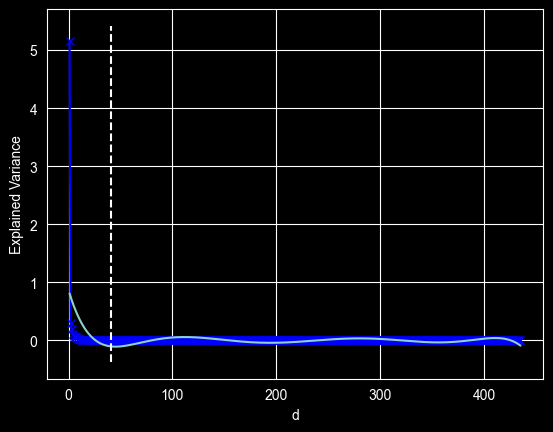

  0%|          | 0/100 [00:00<?, ?it/s]

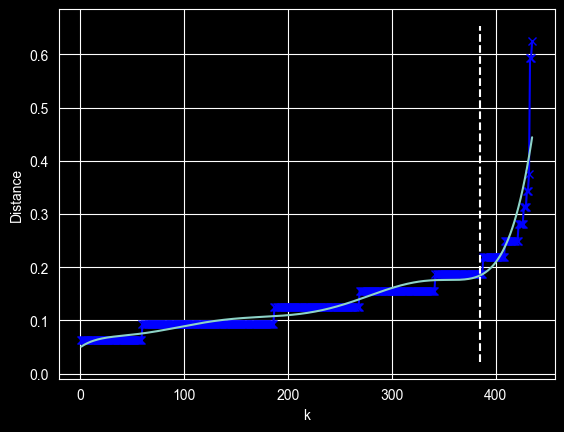

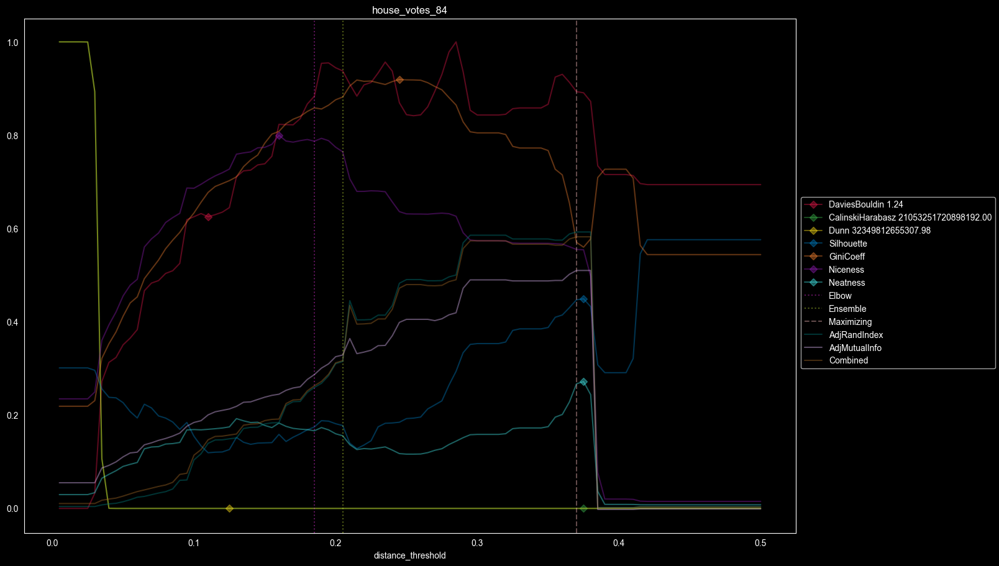

{'Silhouette': 0.4492397508735595, 'Niceness': 0.5544131685336512, 'GiniCoeff': 0.5598731884057971, 'Neatness': 0.2719375603682374, 'sample': {'distance_threshold': 0.37, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 3: 1, 202: 1, 229: 1}, 'DaviesBouldin': 1.106925731808095, 'CalinskiHarabasz': 442.2585019314507, 'Dunn': 0.27163849778099913, 'AdjRandIndex': 0.5924979174356702, 'AdjMutualInfo': 0.5099929442682476, 'Combined': 0.5821399561304121}
0    267
1    168
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.200481      0.139478  0.147137
CalinskiHarabasz       0.509993      0.592498  0.582140
Dunn                   0.213149      0.149259  0.157280
Silhouette             0.509993      0.592498  0.582140
GiniCoeff              0.398754      0.482688  0.472151
Niceness               0.244802      0.1

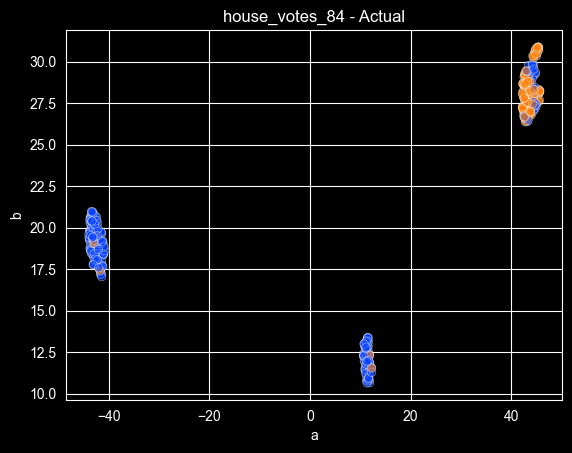

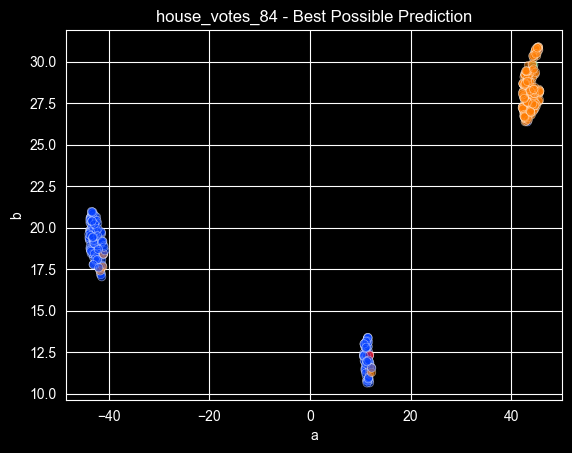

Dataset Summary
n   435.000000
d    16.000000
k     2.000000
e     0.667021
g     0.125543
Name: house_votes_84, dtype: float64


  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/150 [00:00<?, ?it/s]

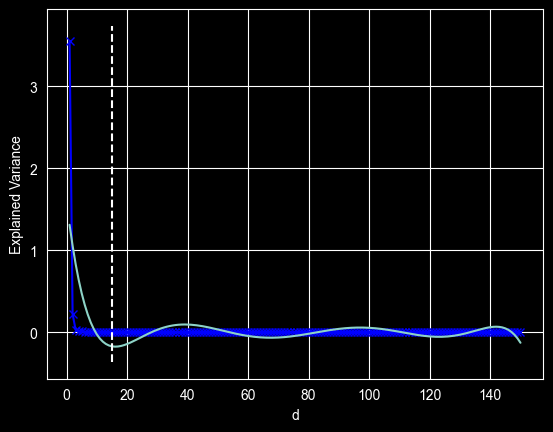

  0%|          | 0/100 [00:00<?, ?it/s]

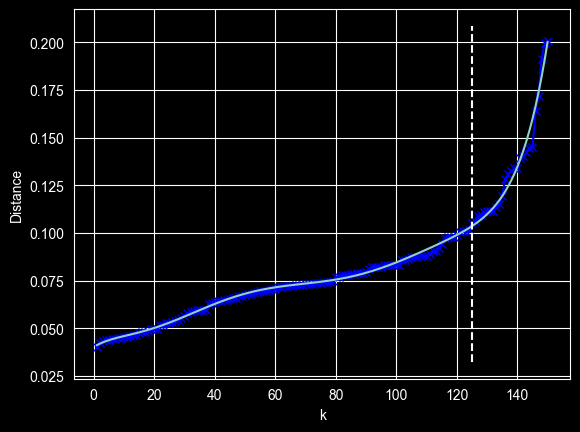

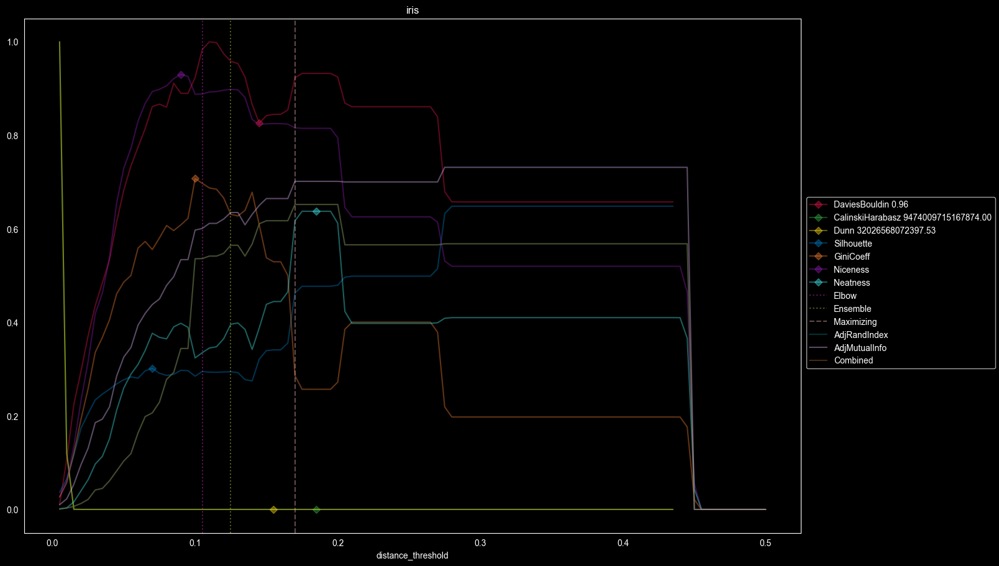

{'Silhouette': 0.47726025597204835, 'Niceness': 0.8149998805271983, 'GiniCoeff': 0.25691699604743085, 'Neatness': 0.6376183780066198, 'sample': {'distance_threshold': 0.17, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {12: 1, 37: 1, 50: 1, 51: 1}, 'DaviesBouldin': 0.897259395549169, 'CalinskiHarabasz': 375.60259226087175, 'Dunn': 0.17073763102706013, 'AdjRandIndex': 0.6521833727068936, 'AdjMutualInfo': 0.7016361903834069, 'Combined': 0.6521833727068936}
2    50
1    50
0    50
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.650256      0.610891  0.610891
CalinskiHarabasz       0.701636      0.652183  0.652183
Dunn                   0.664815      0.617387  0.617387
Silhouette             0.438265      0.206509  0.206509
GiniCoeff              0.597325      0.536117  0.536117
Niceness               0.534188

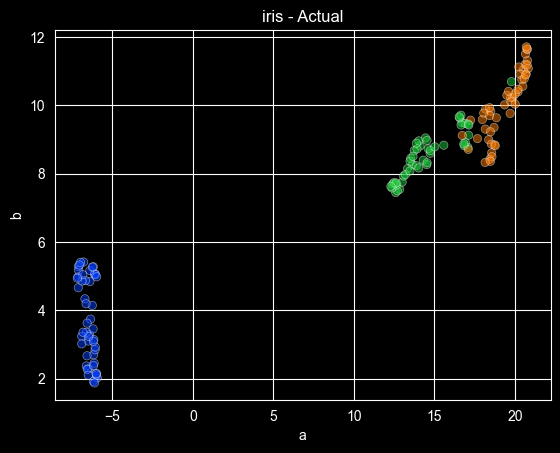

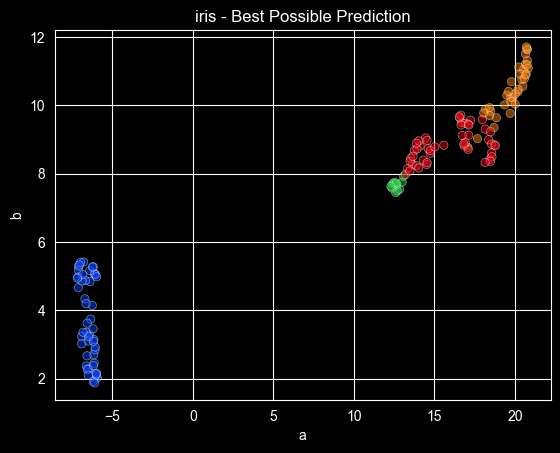

Dataset Summary
n   150.000000
d     4.000000
k     3.000000
e     1.098612
g     0.000000
Name: iris, dtype: float64


  0%|          | 0/41 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

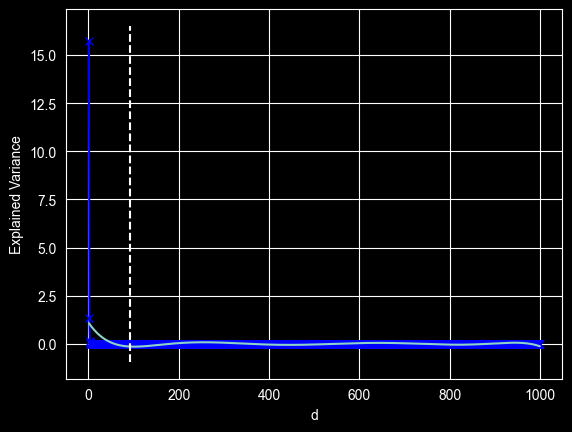

  0%|          | 0/100 [00:00<?, ?it/s]

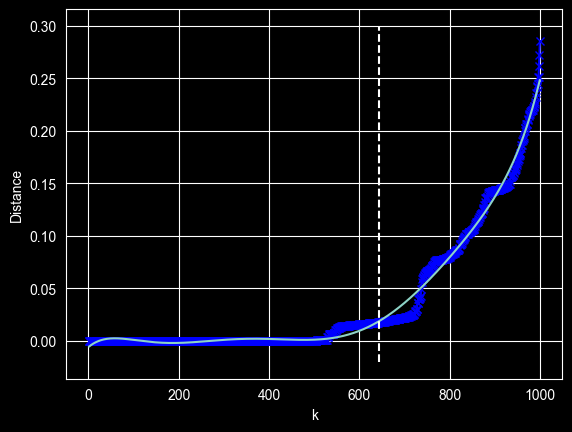

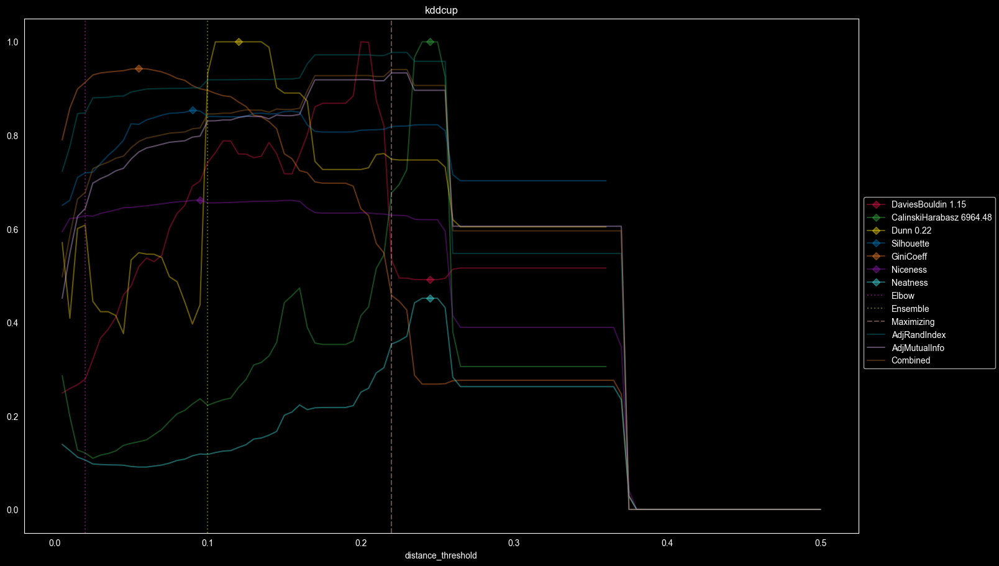

{'Silhouette': 0.8196270461561581, 'Niceness': 0.628834376187744, 'GiniCoeff': 0.4452146094374833, 'Neatness': 0.3605332368093885, 'sample': {'distance_threshold': 0.22, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {21: 1, 191: 1, 220: 1, 568: 1}, 'DaviesBouldin': 0.5687158280053832, 'CalinskiHarabasz': 4838.610418987072, 'Dunn': 0.16736774216822095, 'AdjRandIndex': 0.9772833727498358, 'AdjMutualInfo': 0.9334349029298562, 'Combined': 0.9408196734584192}
18    568
9     217
11    197
0       4
5       3
17      3
20      2
21      2
15      2
14      1
10      1
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.896283      0.958279  0.906724
CalinskiHarabasz       0.896283      0.958279  0.906724
Dunn                   0.837913      0.919041  0.851577
Silhouette             0.796191      0.901528  0.813932
G

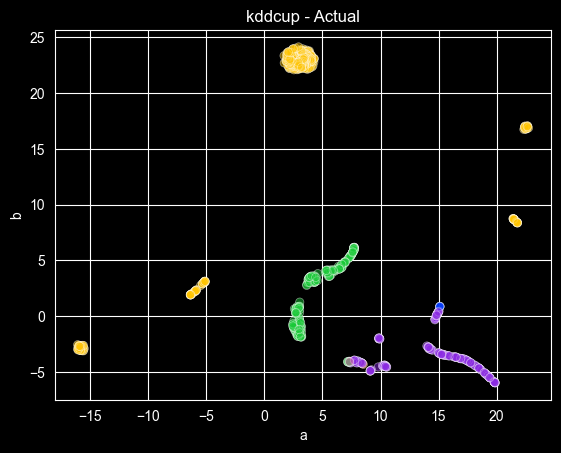

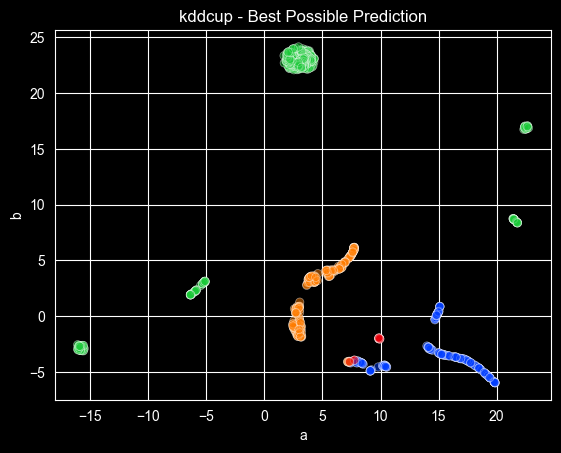

Dataset Summary
n   1000.000000
d     41.000000
k     11.000000
e      1.080906
g      0.831584
Name: kddcup, dtype: float64


  0%|          | 0/216 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

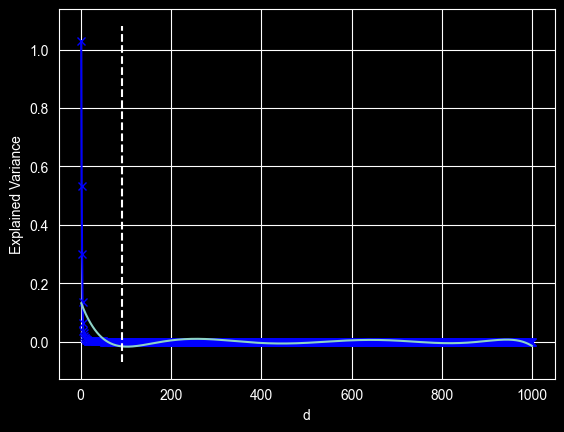

  0%|          | 0/100 [00:00<?, ?it/s]

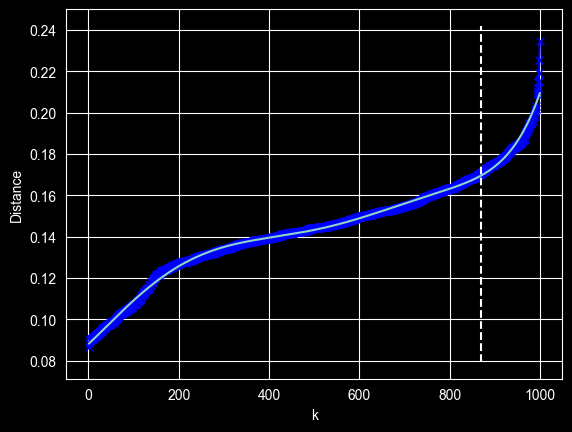

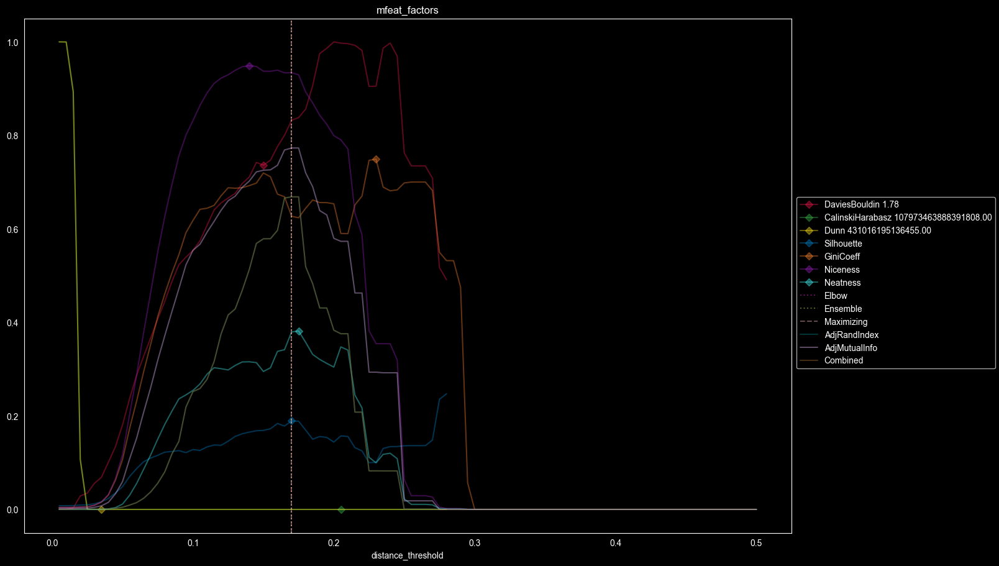

{'Silhouette': 0.1909285734133719, 'Niceness': 0.9343449050122189, 'GiniCoeff': 0.6213131043842854, 'Neatness': 0.3846278793519893, 'sample': {'distance_threshold': 0.17, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 4, 3: 2, 4: 1, 10: 1, 11: 1, 12: 1, 14: 1, 15: 1, 43: 1, 57: 1, 64: 1, 76: 1, 81: 1, 94: 1, 96: 1, 99: 1, 109: 1, 205: 1}, 'DaviesBouldin': 1.4867479285338696, 'CalinskiHarabasz': 420.50231534615165, 'Dunn': 0.20326365105781377, 'AdjRandIndex': 0.6685656247852217, 'AdjMutualInfo': 0.7730244129729194, 'Combined': 0.6685656247852217}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.725516      0.578788  0.578788
CalinskiHarabasz       0.573422      0.375761  0.375761
Dunn                   0.007738      

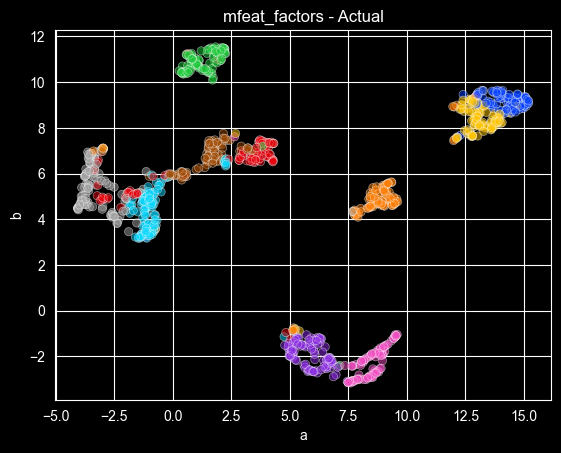

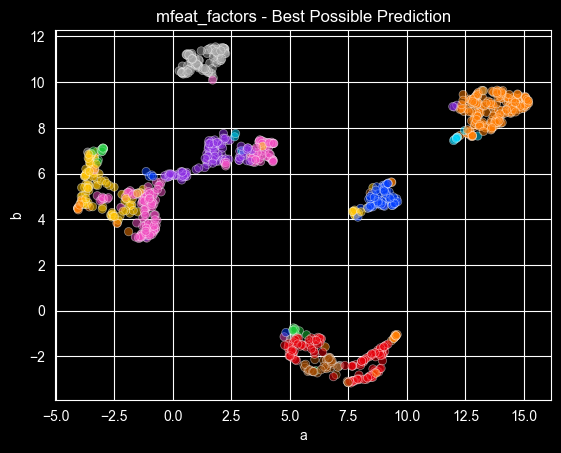

Dataset Summary
n   1000.000000
d    216.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_factors, dtype: float64


  0%|          | 0/76 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

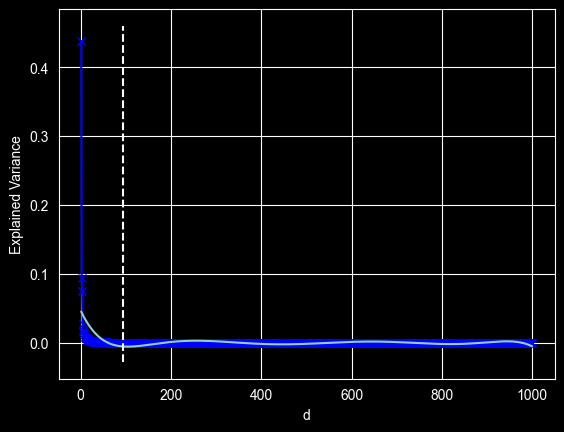

  0%|          | 0/100 [00:00<?, ?it/s]

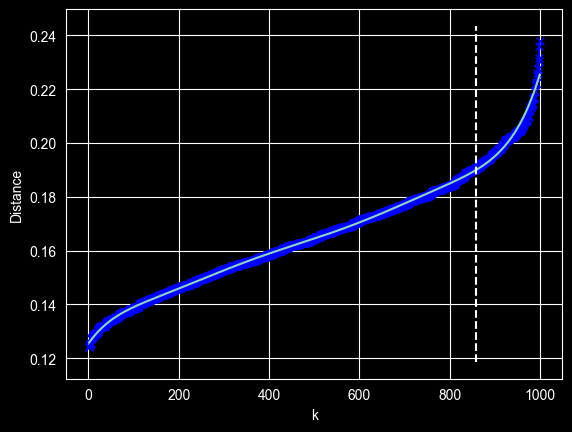

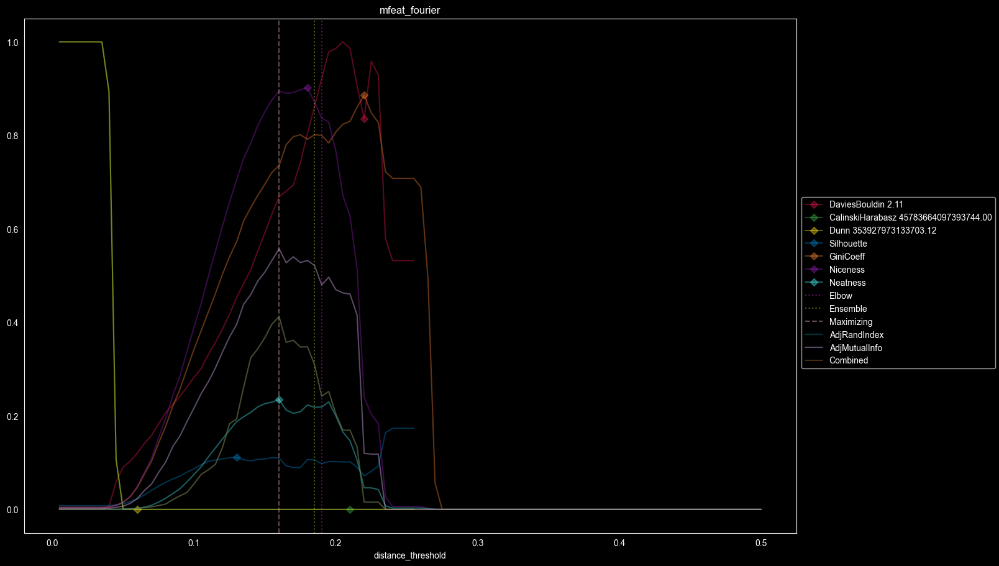

{'Silhouette': 0.11230472286522278, 'Niceness': 0.8984567083301114, 'GiniCoeff': 0.7304185550519862, 'Neatness': 0.2392645846608835, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 36, 2: 21, 3: 13, 4: 10, 5: 6, 6: 3, 7: 4, 8: 2, 9: 4, 10: 1, 11: 3, 13: 1, 14: 1, 16: 1, 17: 2, 21: 1, 26: 2, 27: 1, 28: 1, 34: 1, 35: 1, 45: 1, 65: 1, 91: 1, 98: 1, 99: 1}, 'DaviesBouldin': 1.4164660642177664, 'CalinskiHarabasz': 133.3612118273029, 'Dunn': 0.3223715153931762, 'AdjRandIndex': 0.4122044348623299, 'AdjMutualInfo': 0.557414731125357, 'Combined': 0.4122044348623299}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.119510      0.015584  0.015584
CalinskiHarabasz       0.460533      0.1695

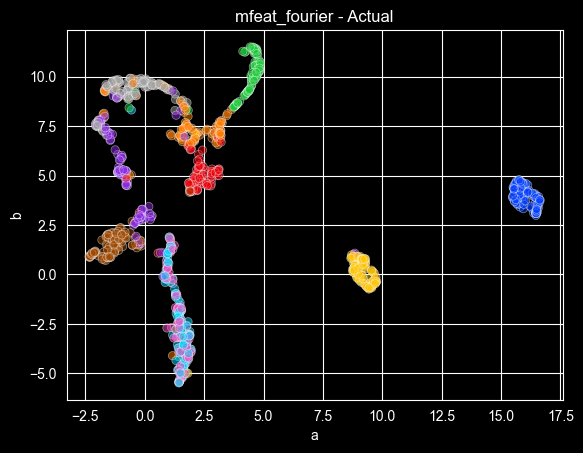

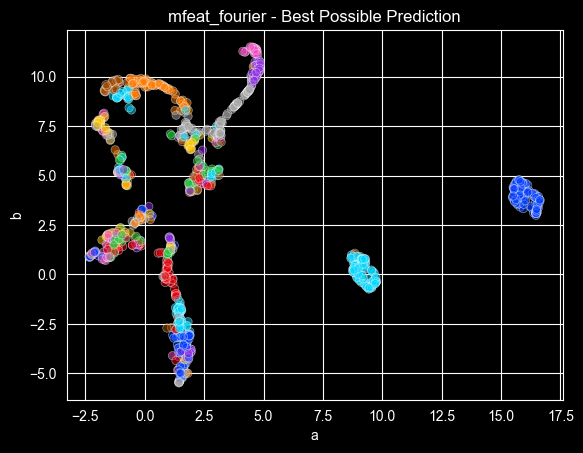

Dataset Summary
n   1000.000000
d     76.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_fourier, dtype: float64


  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

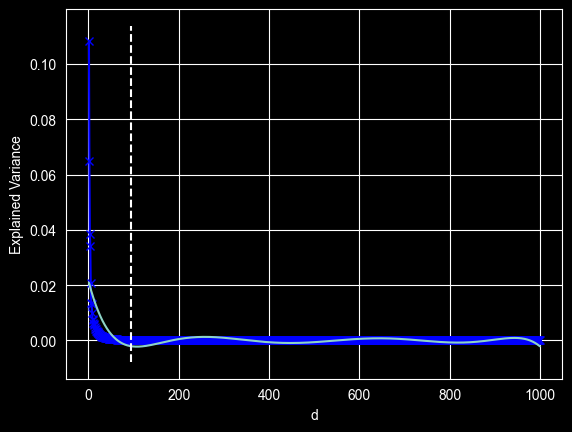

  0%|          | 0/100 [00:00<?, ?it/s]

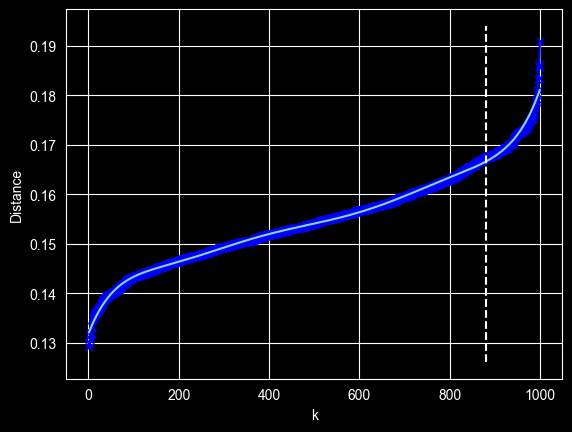

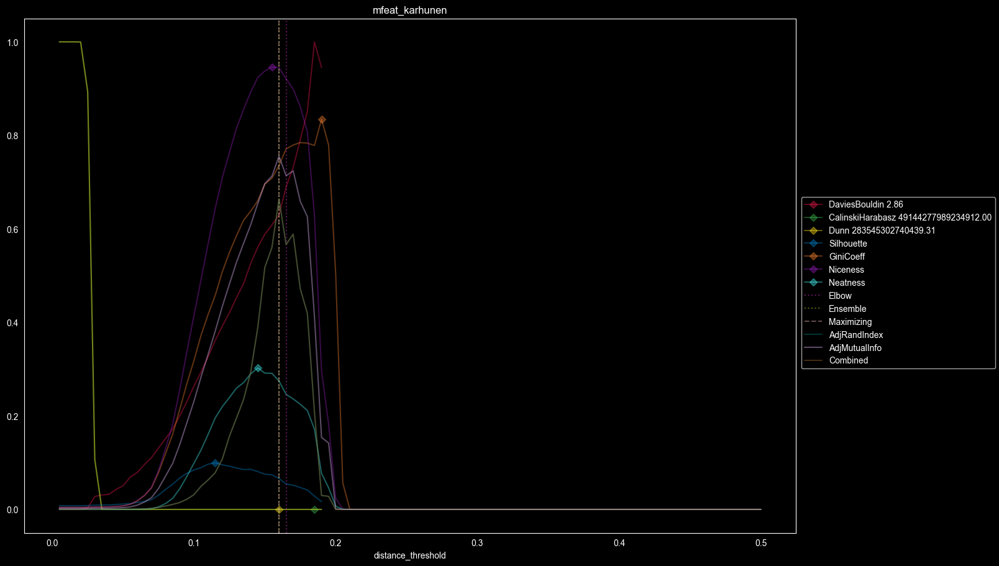

{'Silhouette': 0.06686943155973472, 'Niceness': 0.9481096844799226, 'GiniCoeff': 0.7340200189040498, 'Neatness': 0.2763598578714648, 'sample': {'distance_threshold': 0.16, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 14, 2: 8, 3: 2, 4: 7, 6: 3, 9: 1, 10: 1, 12: 1, 13: 1, 14: 1, 16: 2, 18: 1, 20: 1, 33: 1, 43: 1, 45: 1, 49: 1, 54: 1, 64: 1, 65: 1, 81: 1, 82: 1, 88: 1, 89: 1, 97: 1}, 'DaviesBouldin': 1.7807608561335357, 'CalinskiHarabasz': 240.53085074382537, 'Dunn': 0.41648758145249365, 'AdjRandIndex': 0.6640914059208975, 'AdjMutualInfo': 0.7557528439692964, 'Combined': 0.6640914059208975}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.000000      0.000000  0.000000
CalinskiHarabasz       0.412535      0.208576  

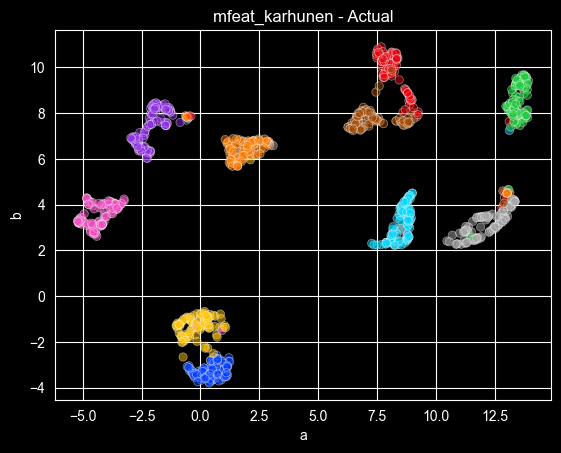

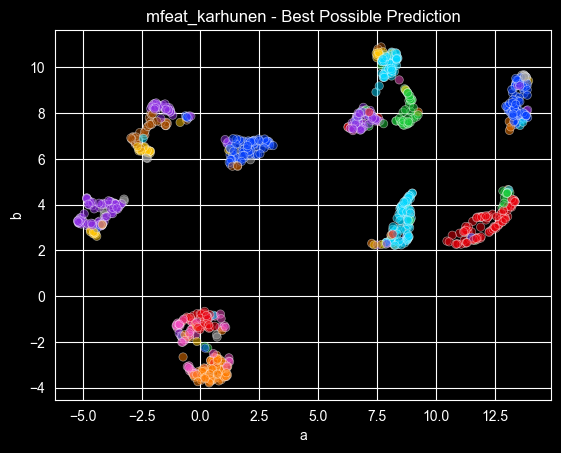

Dataset Summary
n   1000.000000
d     64.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_karhunen, dtype: float64


  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

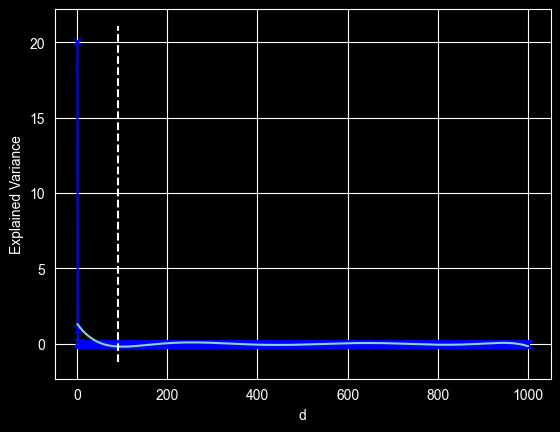

  0%|          | 0/100 [00:00<?, ?it/s]

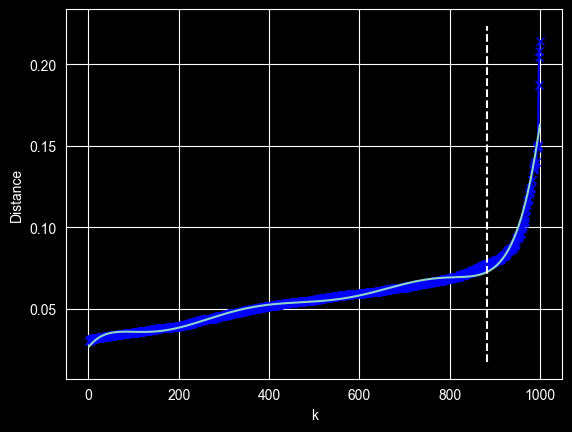

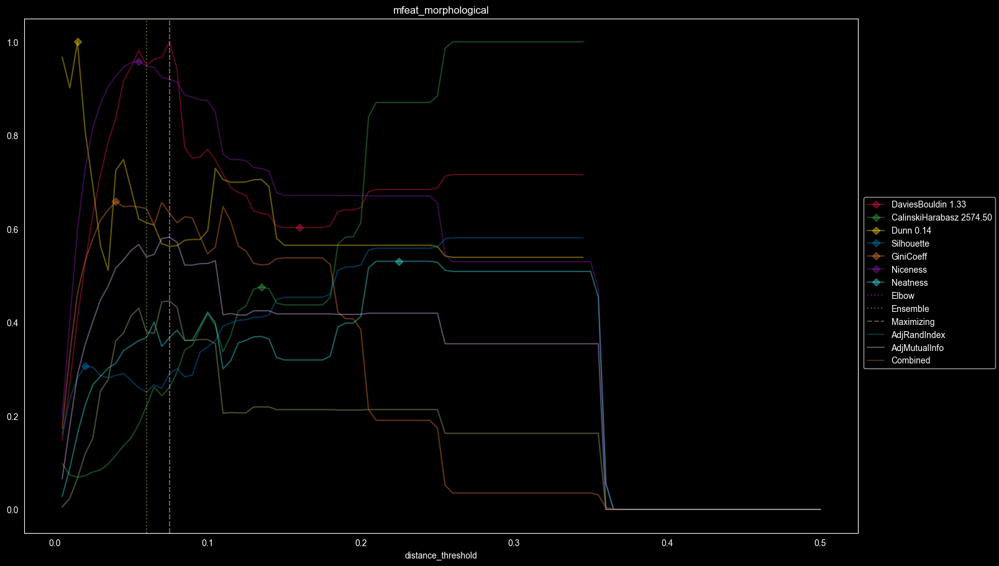

{'Silhouette': 0.29417133362190273, 'Niceness': 0.9210483235922831, 'GiniCoeff': 0.6326453296664749, 'Neatness': 0.3690206458055882, 'sample': {'distance_threshold': 0.075, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 1, 3: 1, 5: 1, 11: 1, 12: 1, 16: 1, 21: 1, 37: 1, 40: 1, 71: 1, 88: 1, 99: 1, 100: 1, 127: 1, 171: 1, 194: 1}, 'DaviesBouldin': 1.3425951676242676, 'CalinskiHarabasz': 669.6603246080958, 'Dunn': 0.07685529351756466, 'AdjRandIndex': 0.4460201745529821, 'AdjMutualInfo': 0.5820250028667019, 'Combined': 0.4460201745529821}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.418273      0.213496  0.213496
CalinskiHarabasz       0.424802      0.219192  0.219192
Dunn                   0.288421      0.066

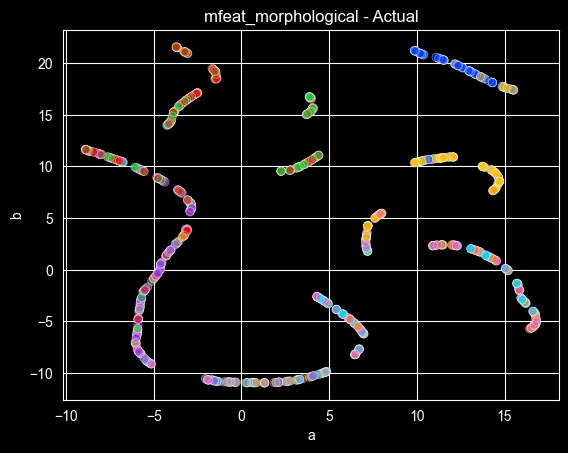

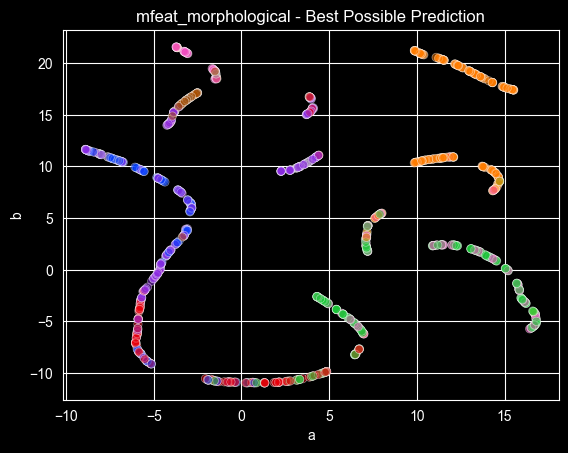

Dataset Summary
n   1000.000000
d      6.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_morphological, dtype: float64


  0%|          | 0/240 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

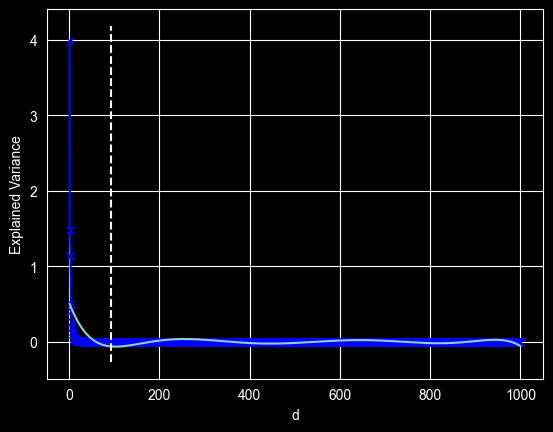

  0%|          | 0/100 [00:00<?, ?it/s]

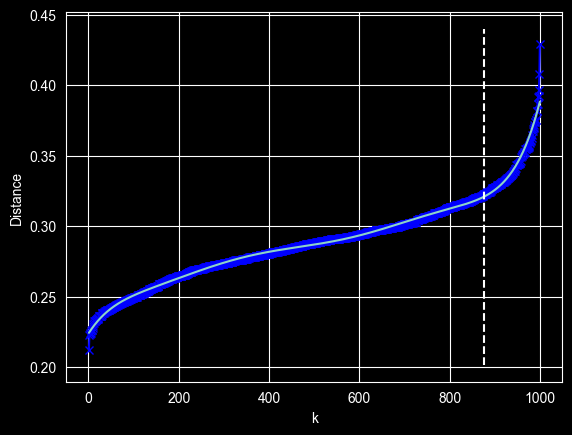

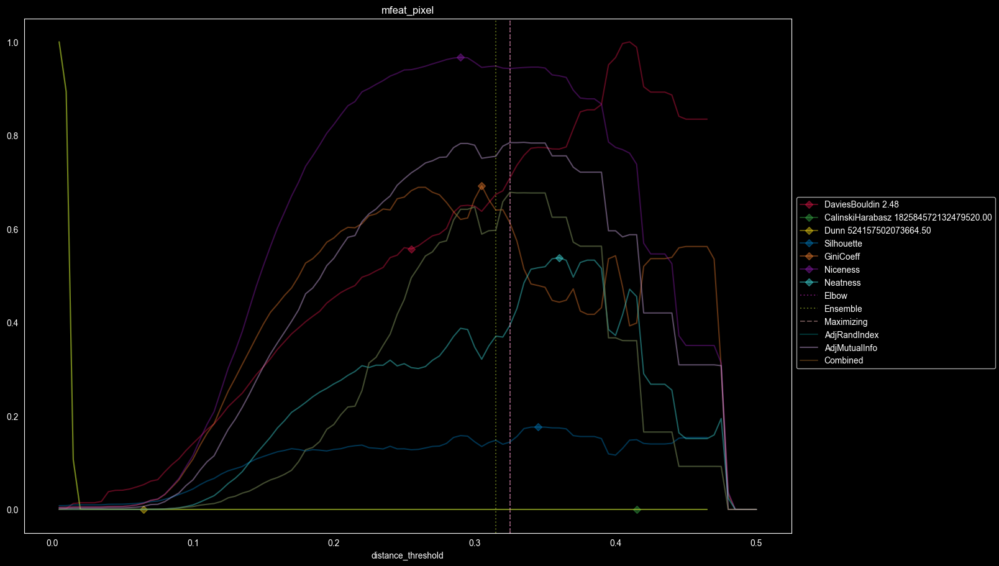

{'Silhouette': 0.14361141338278594, 'Niceness': 0.9427662997458479, 'GiniCoeff': 0.6135871014106383, 'Neatness': 0.39320234912526764, 'sample': {'distance_threshold': 0.325, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 2: 1, 3: 2, 5: 1, 6: 1, 7: 1, 9: 1, 10: 1, 11: 1, 12: 1, 27: 1, 34: 1, 54: 1, 71: 1, 75: 1, 88: 1, 95: 2, 96: 1, 131: 1, 164: 1}, 'DaviesBouldin': 1.7610587464286482, 'CalinskiHarabasz': 364.09952717925523, 'Dunn': 0.212375515783766, 'AdjRandIndex': 0.6781970040401452, 'AdjMutualInfo': 0.7845445056538018, 'Combined': 0.6781970040401452}
9    100
6    100
4    100
2    100
5    100
7    100
3    100
1    100
0    100
8    100
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.719876      0.495368  0.495368
CalinskiHarabasz       0.587588      0.360937  0.360937
Dunn                   0.0

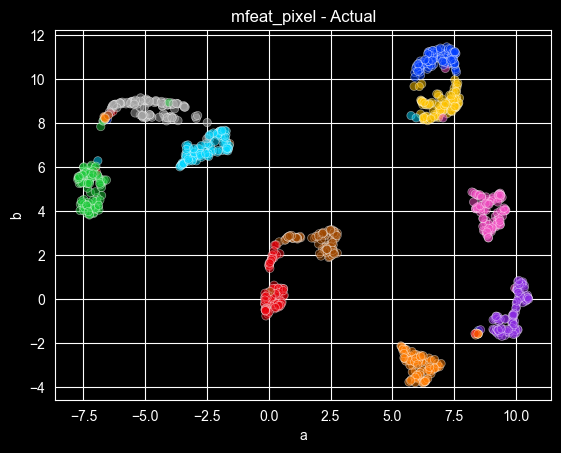

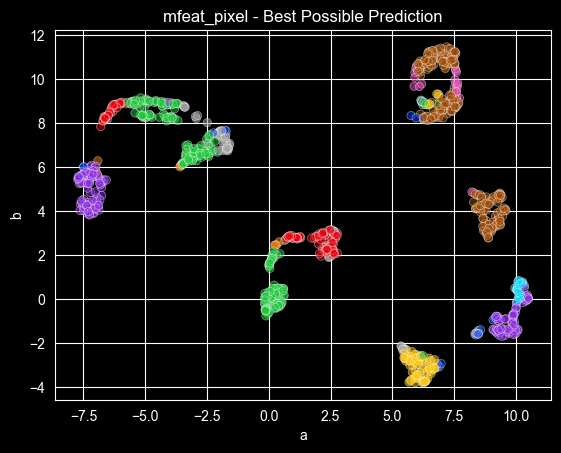

Dataset Summary
n   1000.000000
d    240.000000
k     10.000000
e      2.302585
g      0.000000
Name: mfeat_pixel, dtype: float64


  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/215 [00:00<?, ?it/s]

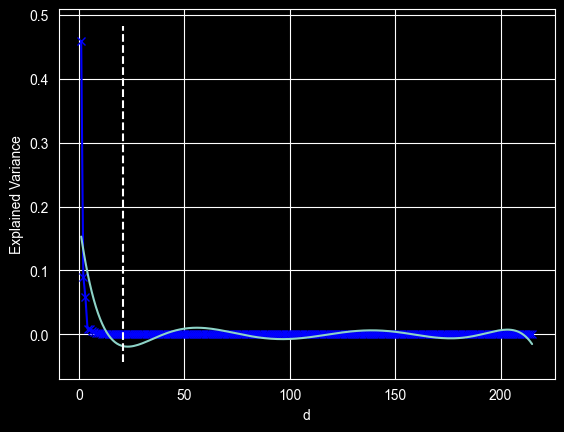

  0%|          | 0/100 [00:00<?, ?it/s]

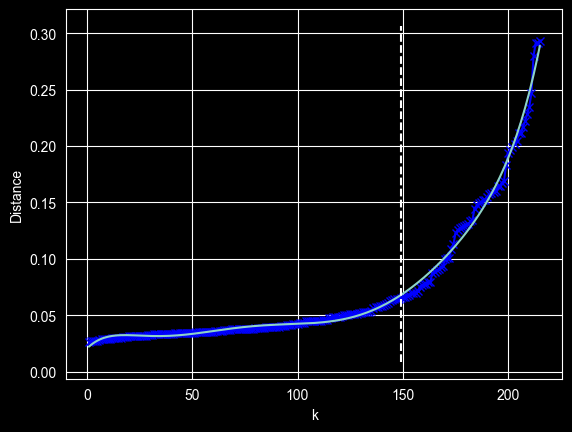

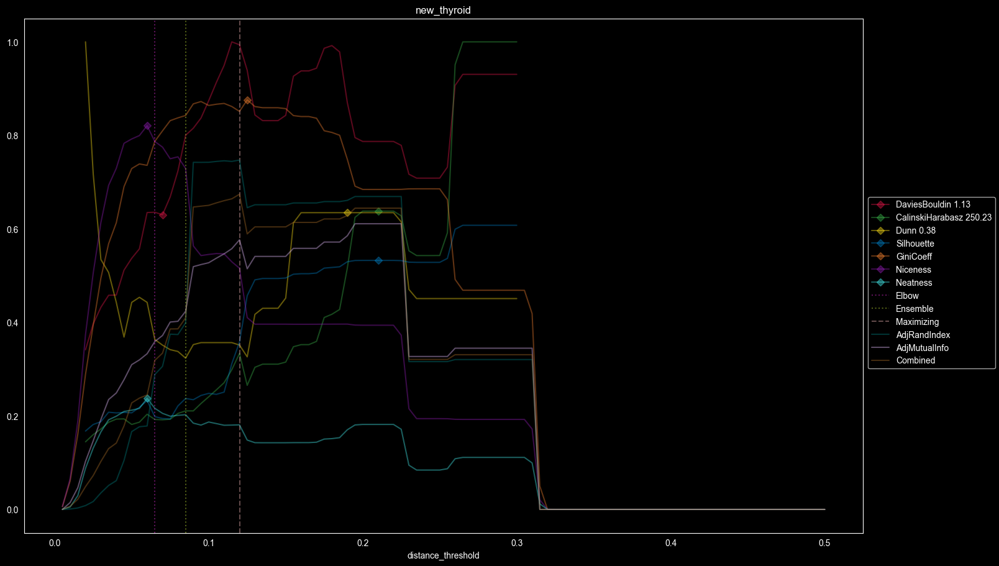

{'Silhouette': 0.3487242085898186, 'Niceness': 0.5305229485396384, 'GiniCoeff': 0.8454545454545455, 'Neatness': 0.18603263678842008, 'sample': {'distance_threshold': 0.12, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 2, 3: 2, 5: 1, 7: 1, 10: 1, 11: 1, 19: 1, 152: 1}, 'DaviesBouldin': 1.1250660532760854, 'CalinskiHarabasz': 87.6958221377228, 'Dunn': 0.1339017936171292, 'AdjRandIndex': 0.7472396095182403, 'AdjMutualInfo': 0.5766370238441718, 'Combined': 0.6741242156579252}
1    150
2     35
3     30
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.372000      0.305945  0.334254
CalinskiHarabasz       0.610998      0.669233  0.644276
Dunn                   0.585250      0.660994  0.628532
Silhouette             0.610998      0.669233  0.644276
GiniCoeff              0.514707      0.645321  0.589343


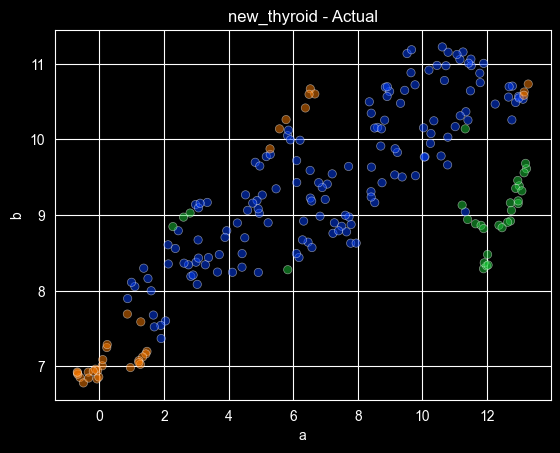

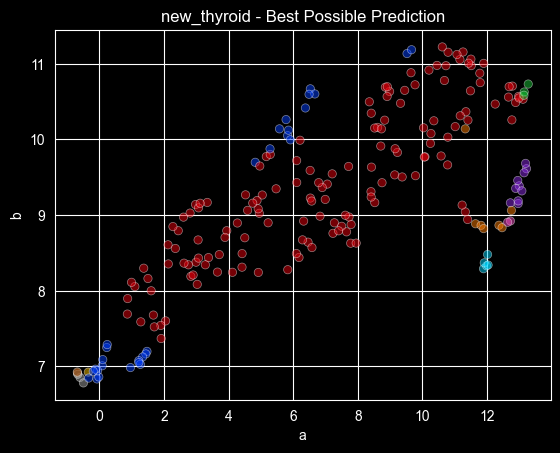

Dataset Summary
n   215.000000
d     5.000000
k     3.000000
e     0.821483
g     0.428571
Name: new_thyroid, dtype: float64


  0%|          | 0/64 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

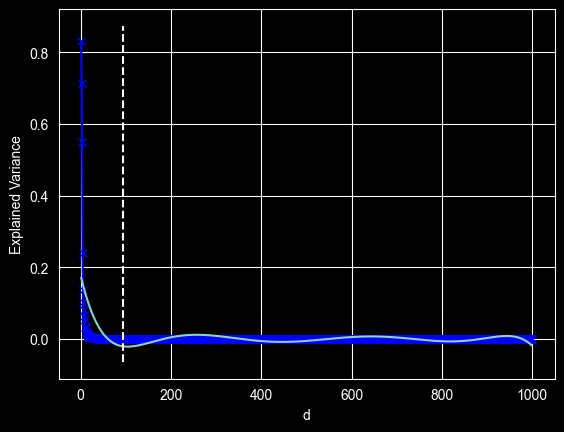

  0%|          | 0/100 [00:00<?, ?it/s]

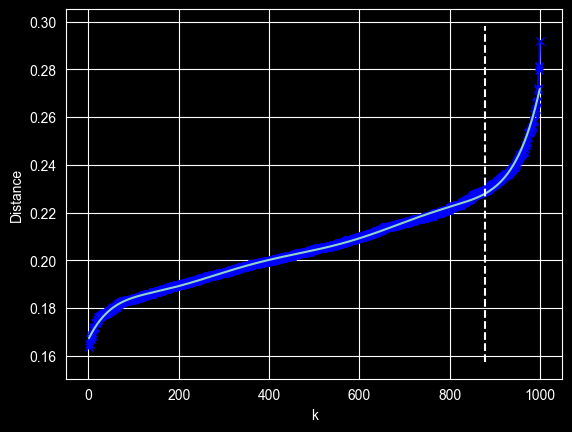

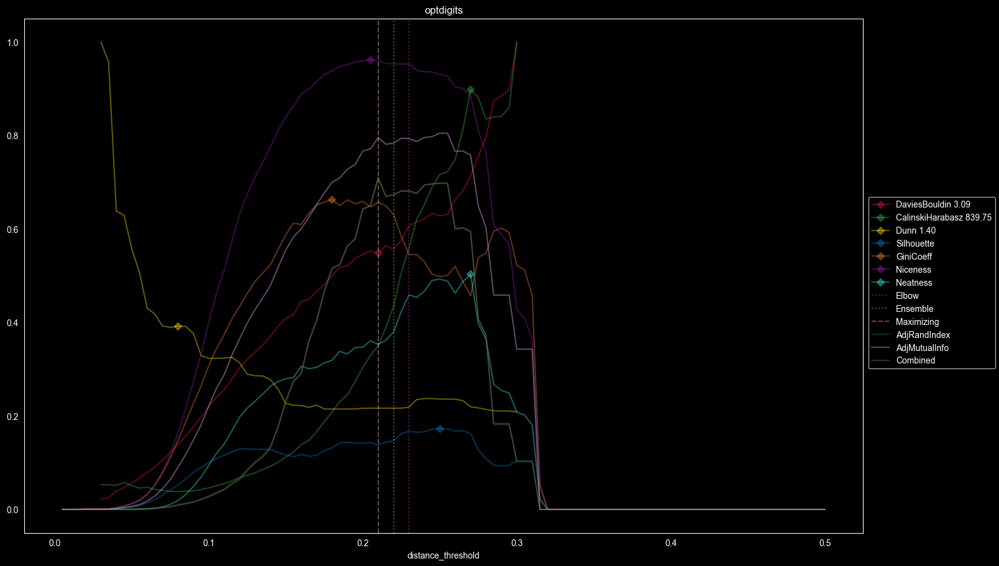

{'Silhouette': 0.13581742464671387, 'Niceness': 0.9596154491565222, 'GiniCoeff': 0.6599085772249351, 'Neatness': 0.3504120473760285, 'sample': {'distance_threshold': 0.21, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 7, 2: 2, 3: 2, 4: 3, 5: 1, 6: 3, 7: 2, 9: 1, 10: 1, 11: 1, 12: 1, 13: 1, 15: 1, 19: 2, 20: 1, 24: 1, 40: 1, 48: 1, 58: 1, 63: 1, 68: 1, 71: 1, 78: 1, 81: 1, 86: 1, 94: 1, 95: 1}, 'DaviesBouldin': 1.6834866885076276, 'CalinskiHarabasz': 292.1056263713691, 'Dunn': 0.3022712268496753, 'AdjRandIndex': 0.7095530407041443, 'AdjMutualInfo': 0.7951481689361749, 'Combined': 0.7102284914627868}
3    102
1    102
7    101
4    101
9    100
2     99
6     99
8     99
5     99
0     98
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.795148      0.709553  0.710228
CalinskiHarabasz       0.757738      0

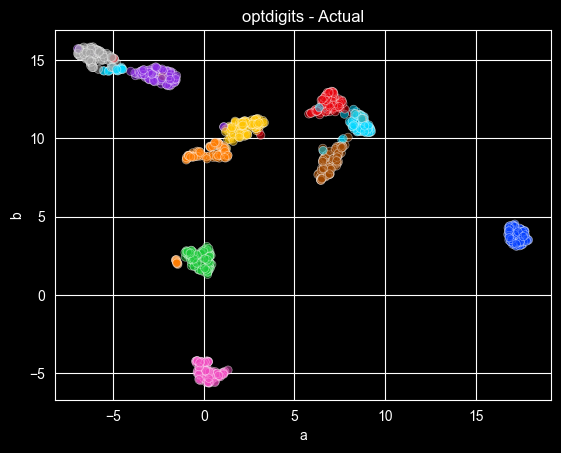

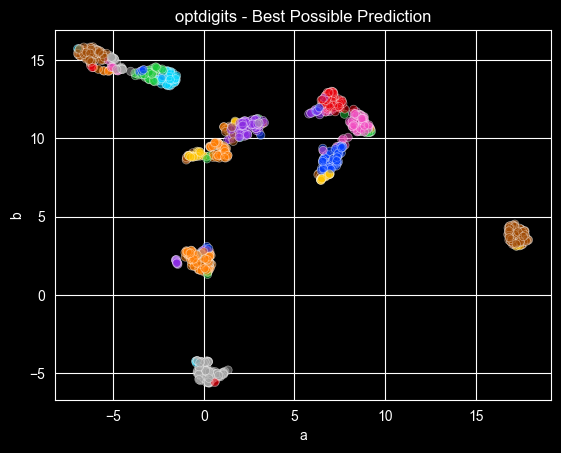

Dataset Summary
n   1000.000000
d     64.000000
k     10.000000
e      2.302495
g      0.007891
Name: optdigits, dtype: float64


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

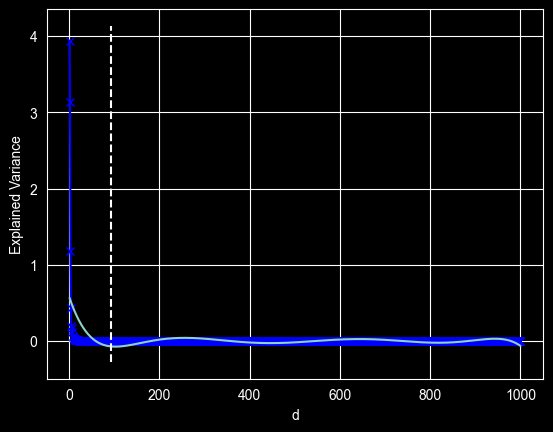

  0%|          | 0/100 [00:00<?, ?it/s]

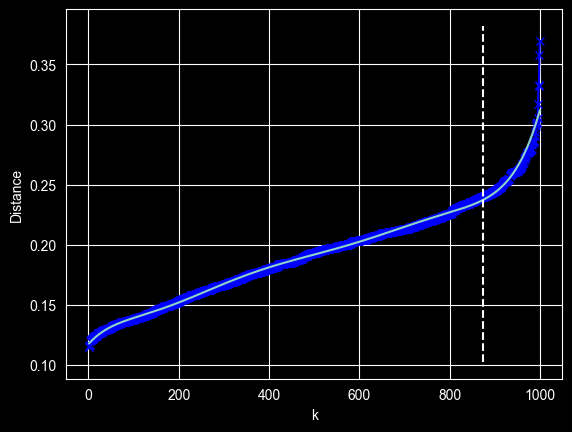

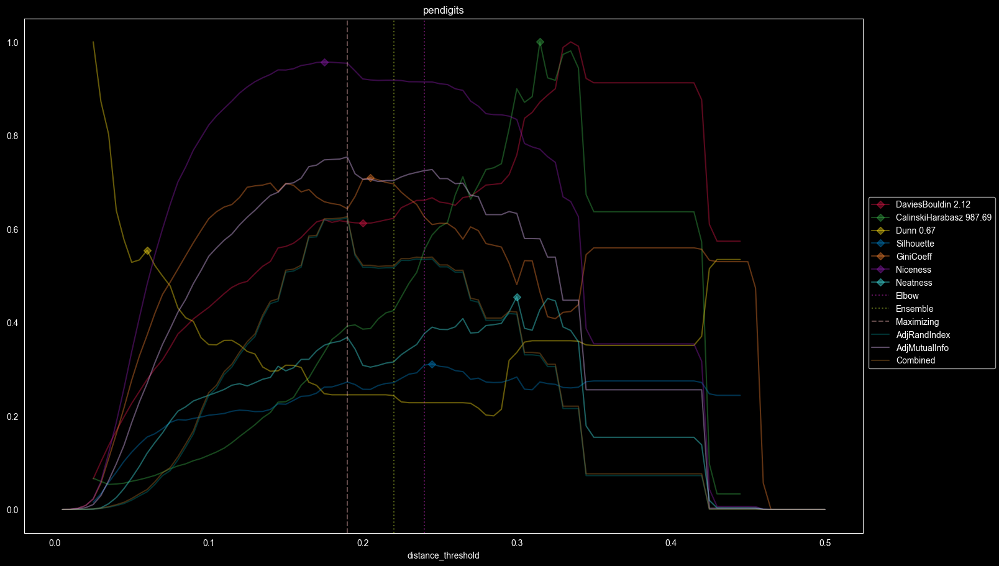

{'Silhouette': 0.27399100743796057, 'Niceness': 0.9563948544295543, 'GiniCoeff': 0.6384493546818888, 'Neatness': 0.3724477179550388, 'sample': {'distance_threshold': 0.19, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 4, 3: 2, 5: 2, 9: 1, 10: 3, 11: 1, 12: 2, 15: 1, 17: 2, 18: 1, 23: 1, 25: 1, 35: 1, 62: 2, 66: 1, 68: 1, 70: 1, 80: 1, 96: 1, 122: 1, 123: 1}, 'DaviesBouldin': 1.3009874327993933, 'CalinskiHarabasz': 389.13032350425186, 'Dunn': 0.16537851787895144, 'AdjRandIndex': 0.6232675696496791, 'AdjMutualInfo': 0.7538909187493343, 'Combined': 0.6260534581935266}
2    104
4    104
1    104
0    104
7    104
3     96
8     96
6     96
5     96
9     96
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.706272      0.518210  0.522221
CalinskiHarabasz       0.578865      0.328726  0.334061
Dunn      

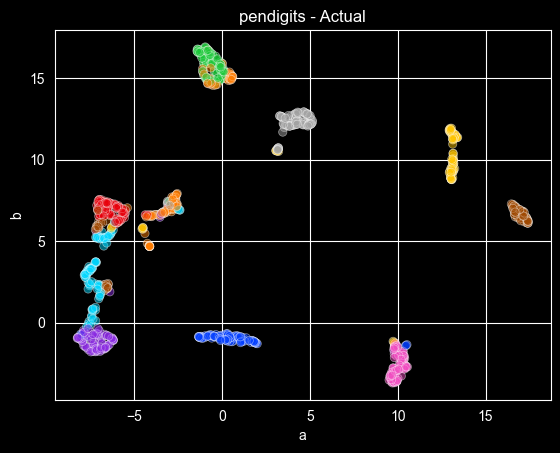

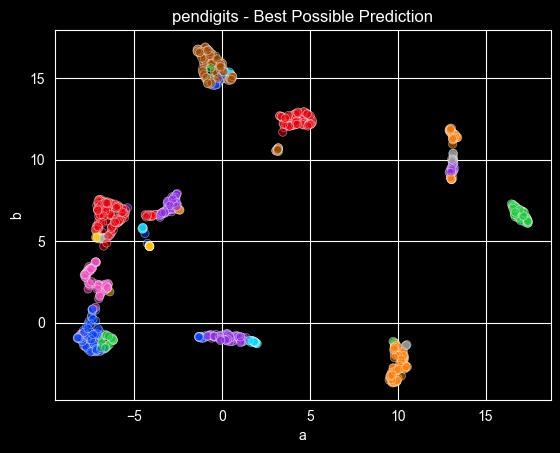

Dataset Summary
n   1000.000000
d     16.000000
k     10.000000
e      2.301785
g      0.021328
Name: pendigits, dtype: float64


  0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/333 [00:00<?, ?it/s]

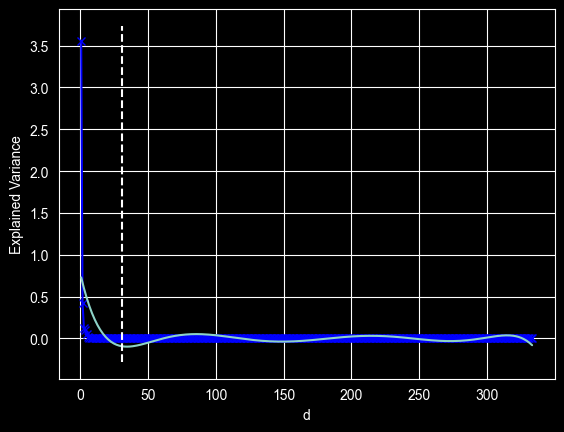

  0%|          | 0/100 [00:00<?, ?it/s]

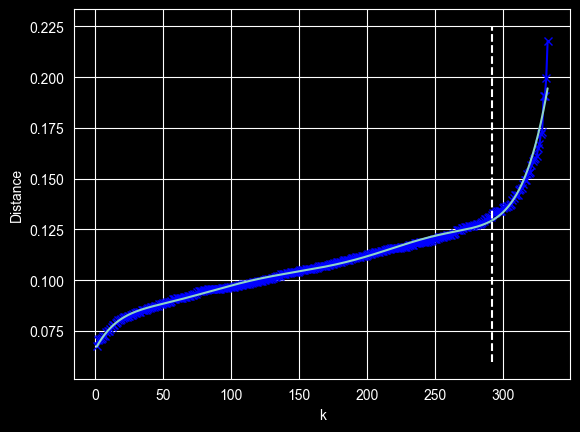

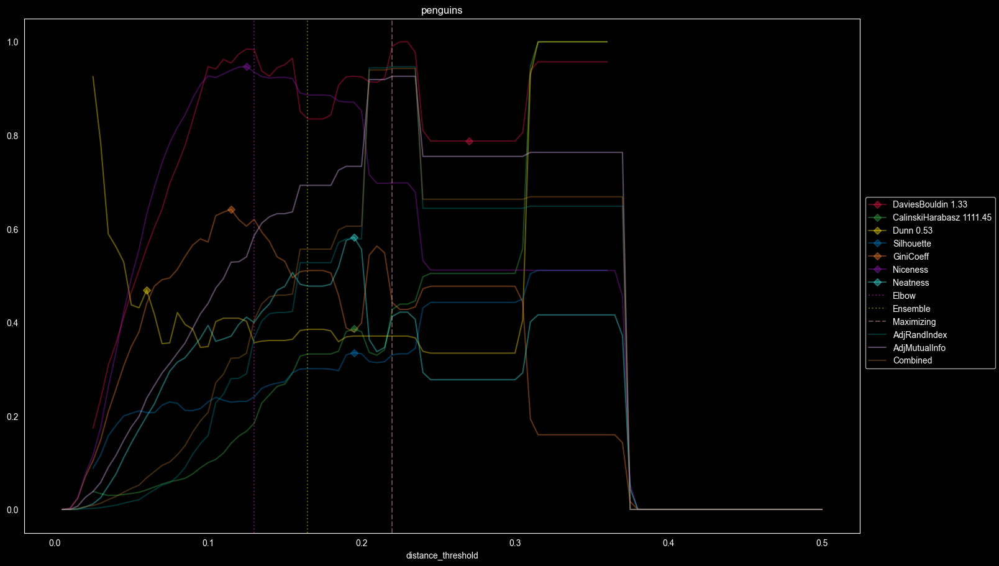

{'Silhouette': 0.3328398142200902, 'Niceness': 0.6982909573948878, 'GiniCoeff': 0.42773109243697477, 'Neatness': 0.42187556561970646, 'sample': {'distance_threshold': 0.22, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 62: 1, 118: 1, 152: 1}, 'DaviesBouldin': 1.3336445240073276, 'CalinskiHarabasz': 488.0436223866292, 'Dunn': 0.19549218895946155, 'AdjRandIndex': 0.9465809308898748, 'AdjMutualInfo': 0.9262724111768521, 'Combined': 0.9430312064358338}
0    146
2    119
1     68
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.754979      0.643956  0.663361
CalinskiHarabasz       0.733783      0.578489  0.605633
Dunn                   0.237752      0.031812  0.067808
Silhouette             0.733783      0.578489  0.605633
GiniCoeff              0.528823      0.279786  0.323315
Niceness               0.54

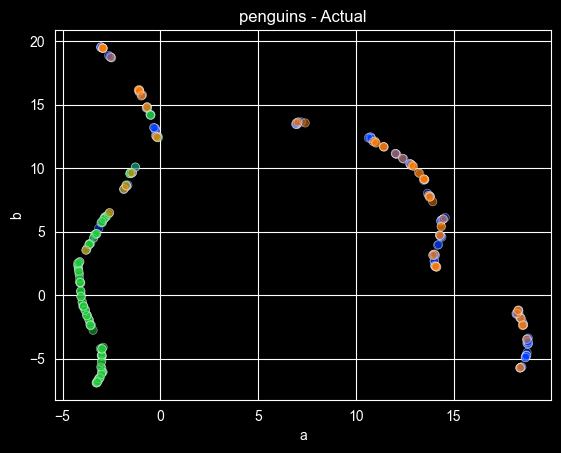

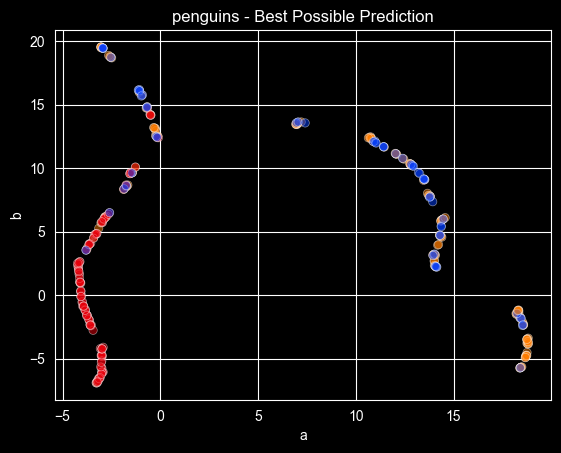

Dataset Summary
n   333.000000
d     7.000000
k     3.000000
e     1.053642
g     0.174790
Name: penguins, dtype: float64


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

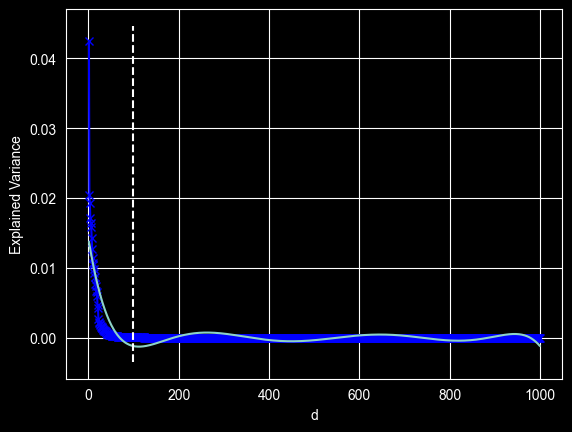

  0%|          | 0/100 [00:00<?, ?it/s]

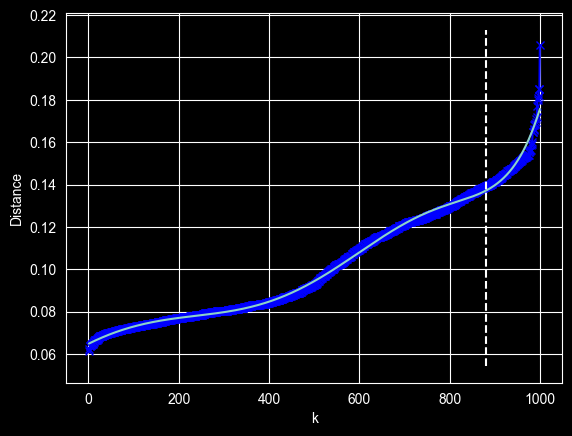

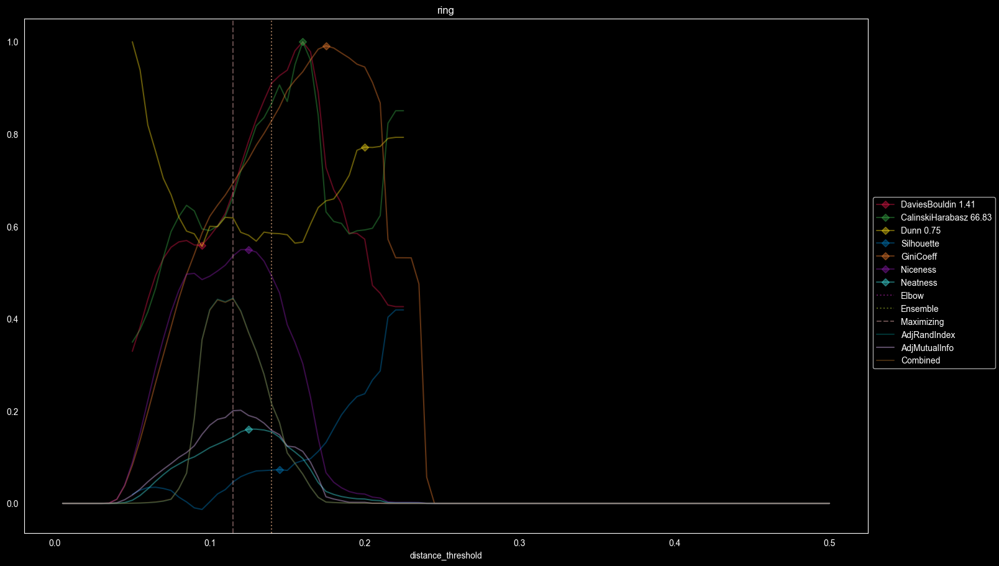

{'Silhouette': 0.047214676384406185, 'Niceness': 0.5368096420052261, 'GiniCoeff': 0.694152147662584, 'Neatness': 0.14347443134016016, 'sample': {'distance_threshold': 0.115, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 202, 2: 67, 3: 17, 4: 13, 5: 5, 13: 1, 523: 1}, 'DaviesBouldin': 0.9504906783916506, 'CalinskiHarabasz': 44.275153133908795, 'Dunn': 0.46794684181871077, 'AdjRandIndex': 0.4447467977622441, 'AdjMutualInfo': 0.20067298696782043, 'Combined': 0.4434454178059955}
1    505
0    495
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.149513      0.355273  0.354176
CalinskiHarabasz       0.112578      0.063311  0.063574
Dunn                   0.002219      0.000588  0.000597
Silhouette             0.148730      0.175136  0.174996
GiniCoeff              0.014334      0.002834  0.002895
Niceness    

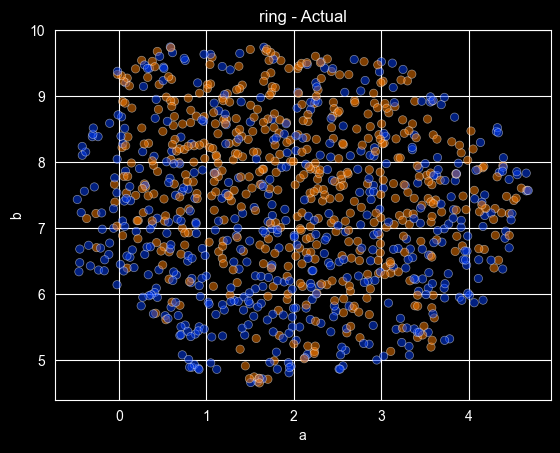

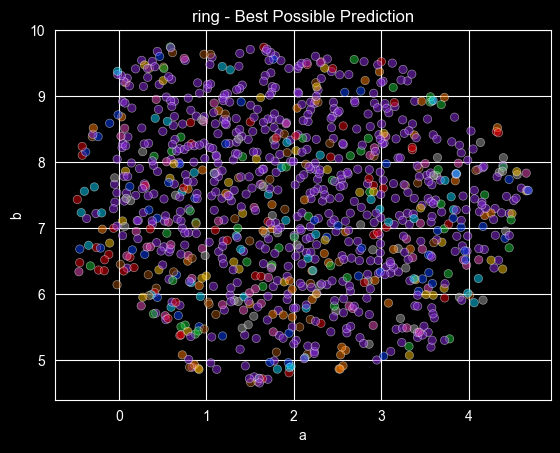

Dataset Summary
n   1000.000000
d     20.000000
k      2.000000
e      0.693097
g      0.005332
Name: ring, dtype: float64


  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

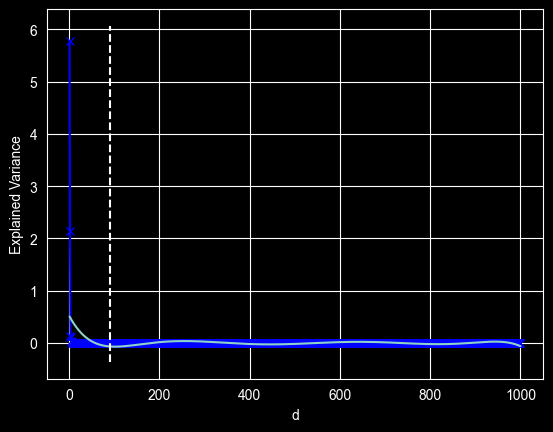

  0%|          | 0/100 [00:00<?, ?it/s]

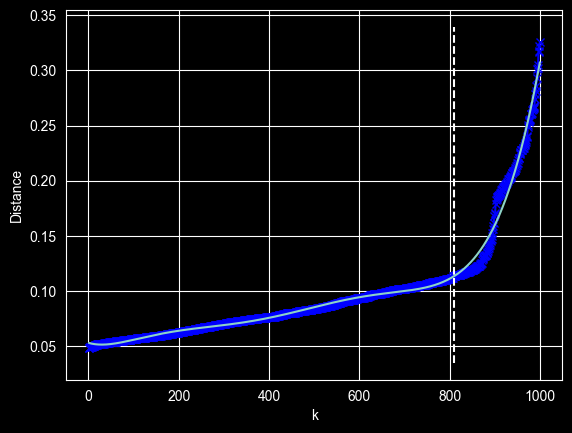

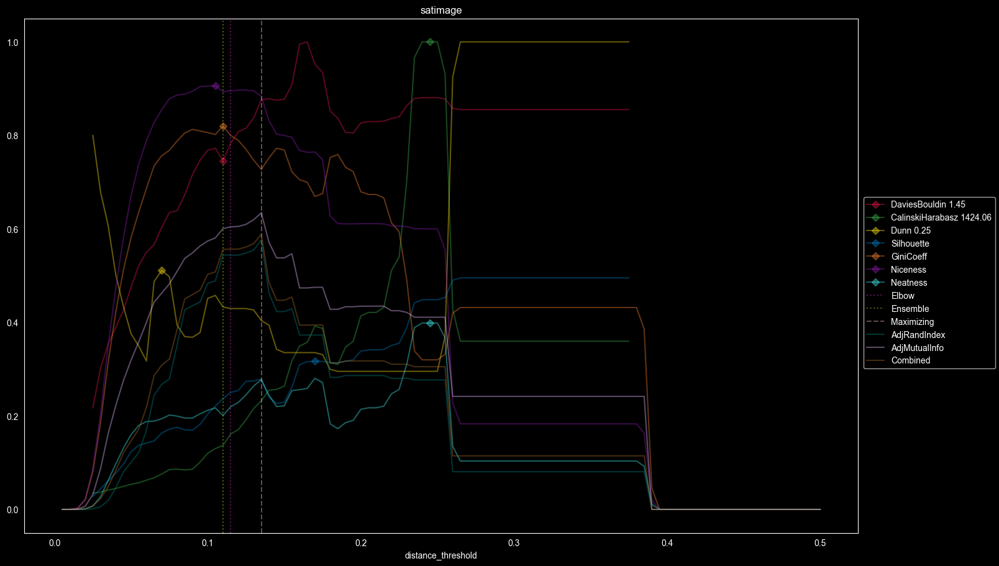

{'Silhouette': 0.28507588322831323, 'Niceness': 0.889773402083625, 'GiniCoeff': 0.7210877099440149, 'Neatness': 0.28409789759200743, 'sample': {'distance_threshold': 0.135, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 1, 2: 2, 3: 2, 5: 4, 6: 3, 11: 1, 63: 1, 65: 1, 126: 1, 130: 1, 133: 1, 204: 1, 219: 1}, 'DaviesBouldin': 1.280411693199564, 'CalinskiHarabasz': 329.1789540407163, 'Dunn': 0.10109051782147623, 'AdjRandIndex': 0.5764374573323956, 'AdjMutualInfo': 0.634382201602045, 'Combined': 0.5886309305777995}
1    238
7    235
3    211
5    110
2    109
4     97
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.600681      0.544261  0.556134
CalinskiHarabasz       0.411090      0.277031  0.305241
Dunn                   0.462745      0.267561  0.308634
Silhouette             0.475110      0.372935  0.394

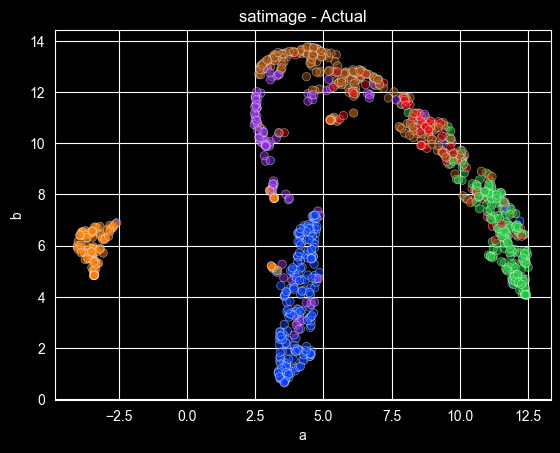

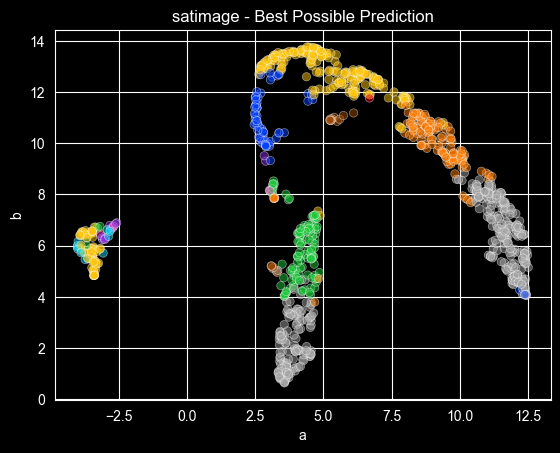

Dataset Summary
n   1000.000000
d     36.000000
k      6.000000
e      1.720953
g      0.210433
Name: satimage, dtype: float64


  0%|          | 0/19 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

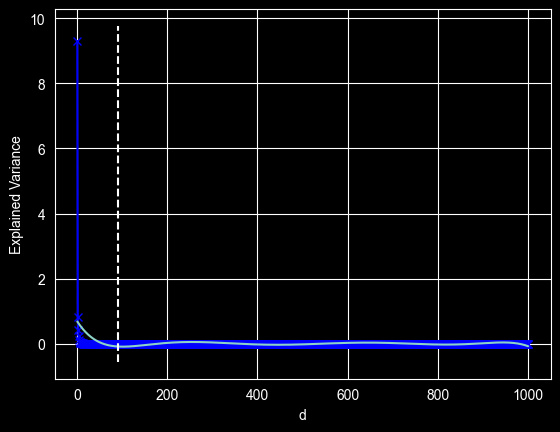

  0%|          | 0/100 [00:00<?, ?it/s]

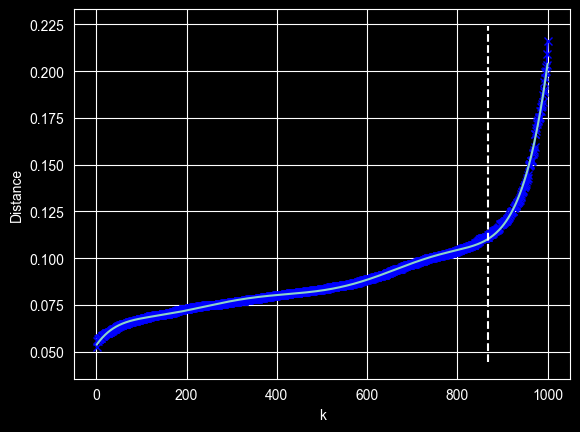

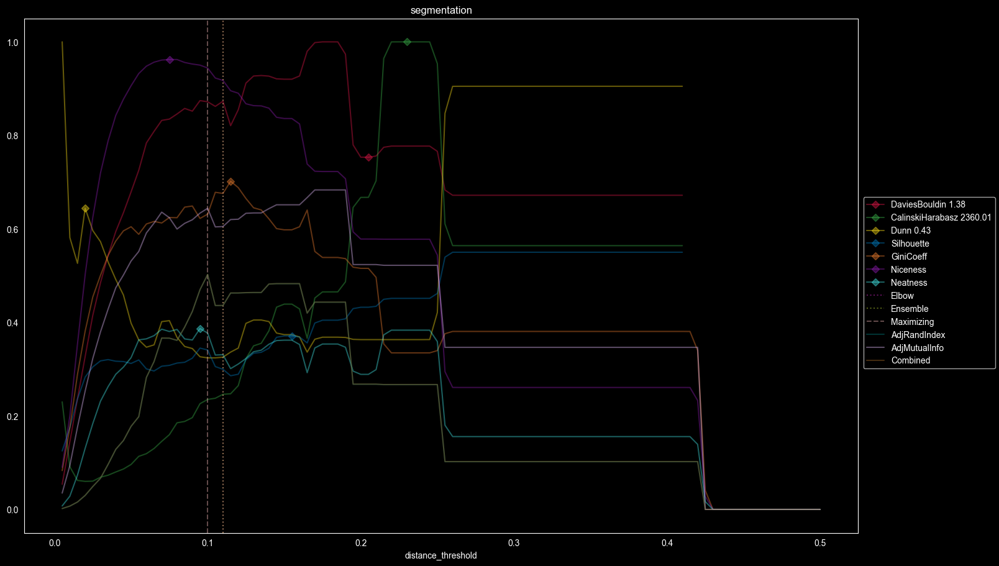

{'Silhouette': 0.3454612679342304, 'Niceness': 0.9464280424996756, 'GiniCoeff': 0.6259237536656892, 'Neatness': 0.3827350545299145, 'sample': {'distance_threshold': 0.1, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 3, 2: 2, 3: 2, 5: 2, 7: 1, 10: 1, 18: 1, 19: 1, 26: 2, 36: 1, 39: 1, 43: 1, 83: 1, 99: 1, 101: 1, 105: 1, 106: 1, 122: 1, 137: 1}, 'DaviesBouldin': 1.2066768121631766, 'CalinskiHarabasz': 556.5100299431747, 'Dunn': 0.14029463072870693, 'AdjRandIndex': 0.5023880466097341, 'AdjMutualInfo': 0.6440153346904408, 'Combined': 0.5025174998951033}
6    143
2    143
4    143
3    143
5    143
1    143
0    142
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.523711      0.267762  0.267996
CalinskiHarabasz       0.522126      0.266919  0.267152
Dunn                   0.253146      0.029850  0.030055
Si

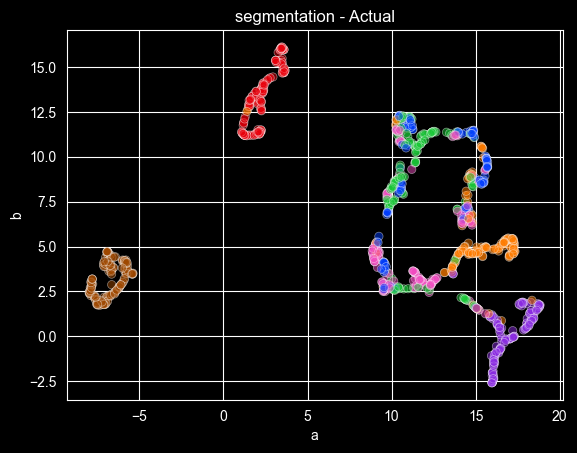

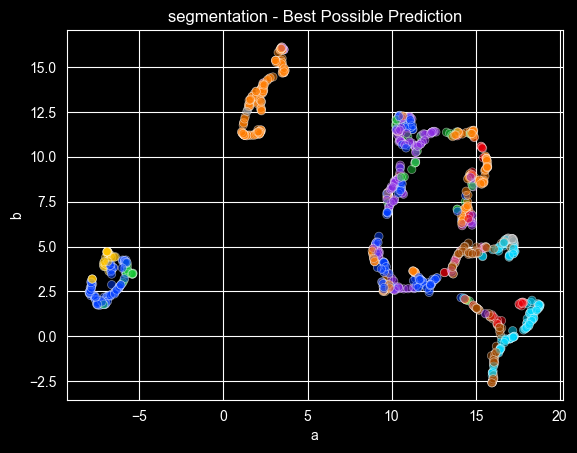

Dataset Summary
n   1000.000000
d     19.000000
k      7.000000
e      1.945907
g      0.000914
Name: segmentation, dtype: float64


  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/675 [00:00<?, ?it/s]

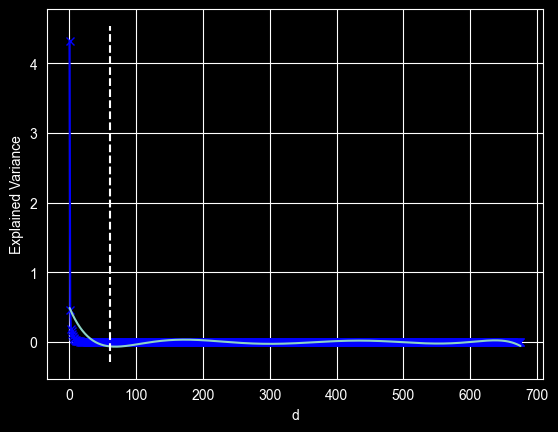

  0%|          | 0/100 [00:00<?, ?it/s]

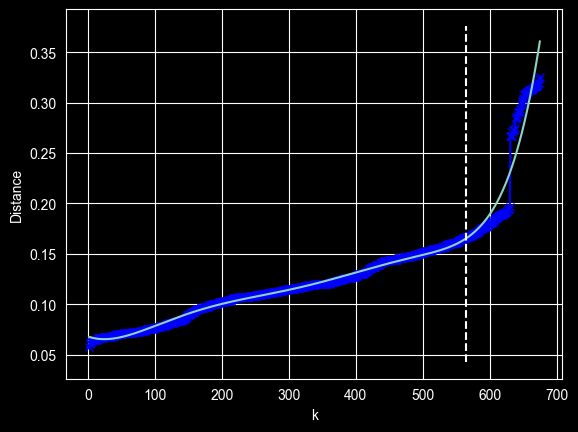

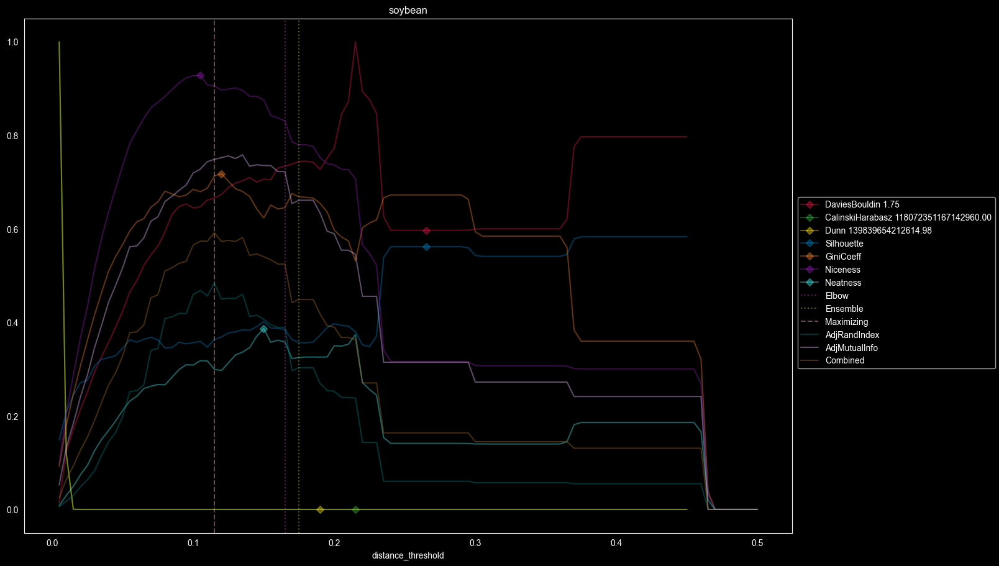

{'Silhouette': 0.3657086058905205, 'Niceness': 0.906976687749207, 'GiniCoeff': 0.7157296940347788, 'Neatness': 0.2973713263426201, 'sample': {'distance_threshold': 0.115, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 8, 2: 5, 3: 3, 4: 2, 5: 1, 6: 3, 7: 1, 8: 1, 9: 2, 11: 1, 14: 1, 15: 1, 16: 1, 20: 5, 24: 2, 31: 1, 40: 1, 59: 1, 68: 1, 182: 1}, 'DaviesBouldin': 1.1633229397833613, 'CalinskiHarabasz': 270.4763451823251, 'Dunn': 0.30821291703617026, 'AdjRandIndex': 0.4838132251747757, 'AdjMutualInfo': 0.7486103588517, 'Combined': 0.5916161685061194}
5     92
12    91
1     91
15    88
6     44
2     44
10    20
17    20
14    20
4     20
7     20
3     20
11    20
16    20
18    20
0     16
9     15
8     14
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.314669      0.060030  0.163698
CalinskiHarabasz  

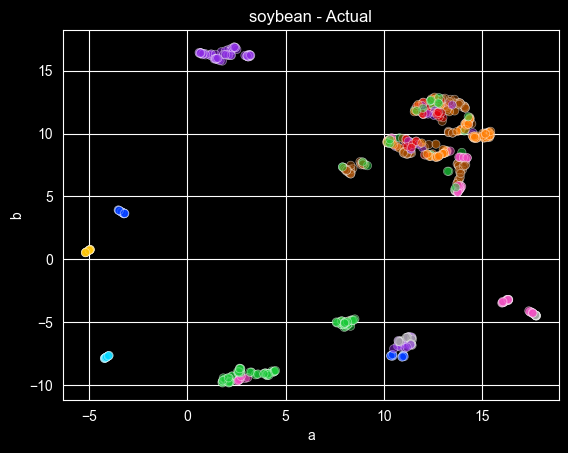

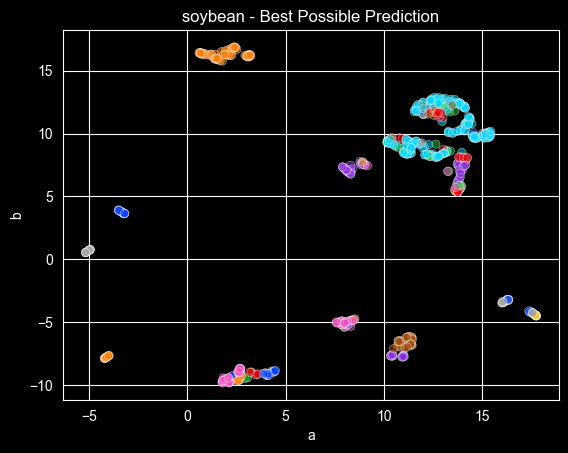

Dataset Summary
n   675.000000
d    35.000000
k    18.000000
e     2.625593
g     0.407115
Name: soybean, dtype: float64


  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

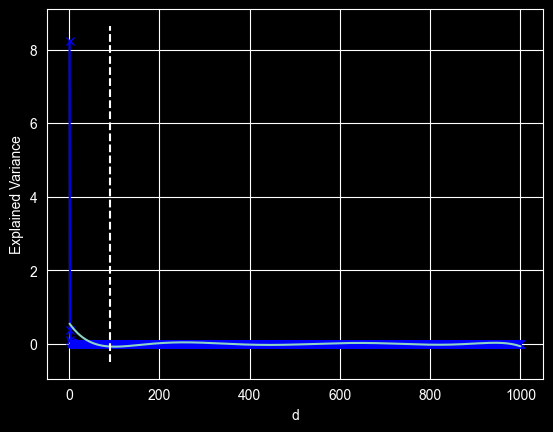

  0%|          | 0/100 [00:00<?, ?it/s]

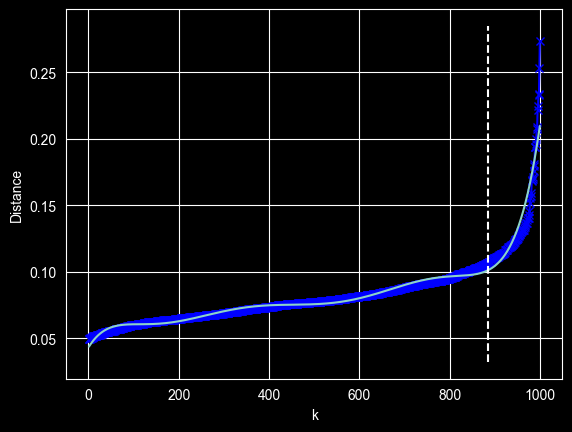

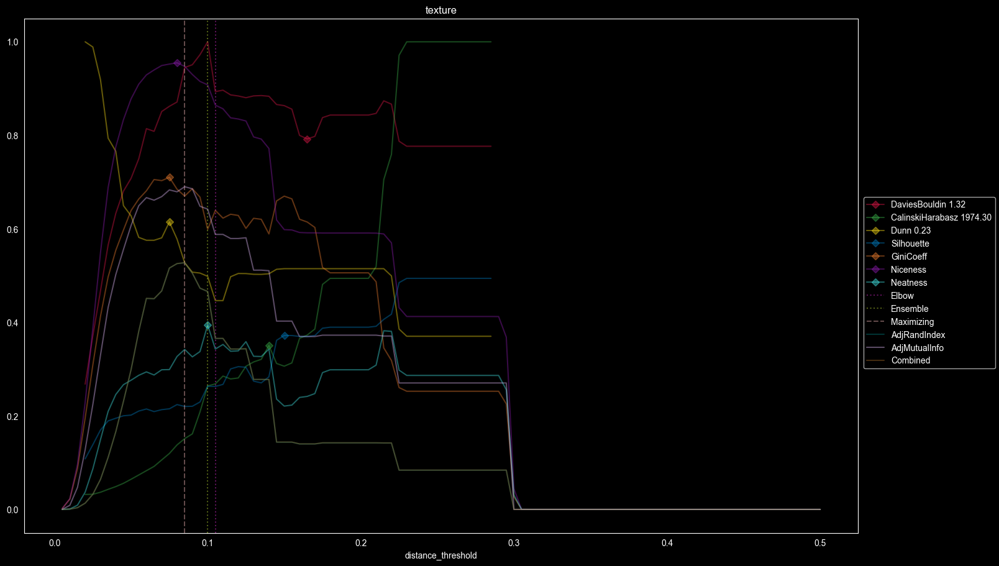

{'Silhouette': 0.21936369048540538, 'Niceness': 0.9486118107570215, 'GiniCoeff': 0.6656891495601173, 'Neatness': 0.3465617895618088, 'sample': {'distance_threshold': 0.085, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 8, 3: 1, 4: 3, 5: 1, 8: 2, 9: 1, 12: 1, 14: 1, 15: 1, 20: 1, 21: 1, 45: 1, 54: 1, 55: 1, 59: 1, 73: 2, 78: 1, 80: 1, 88: 1, 90: 1, 170: 1}, 'DaviesBouldin': 1.266841558677654, 'CalinskiHarabasz': 301.0223042100326, 'Dunn': 0.12151900582919513, 'AdjRandIndex': 0.5275591361154822, 'AdjMutualInfo': 0.6901521510355041, 'Combined': 0.5277167600362985}
7     91
6     91
2     91
3     91
9     91
14    91
13    91
4     91
10    91
12    91
8     90
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.369802      0.139961  0.140184
CalinskiHarabasz       0.510501      0.277697  0.277923
Dunn       

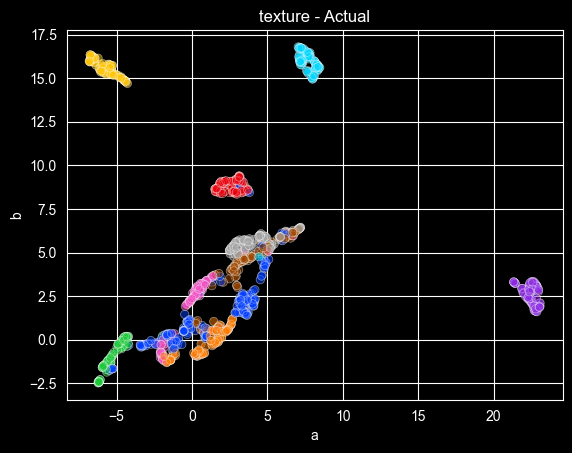

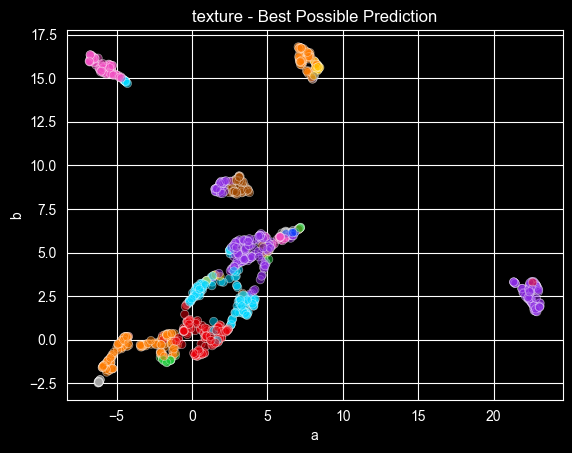

Dataset Summary
n   1000.000000
d     40.000000
k     11.000000
e      2.397890
g      0.000969
Name: texture, dtype: float64


  0%|          | 0/44 [00:00<?, ?it/s]

  0%|          | 0/959 [00:00<?, ?it/s]

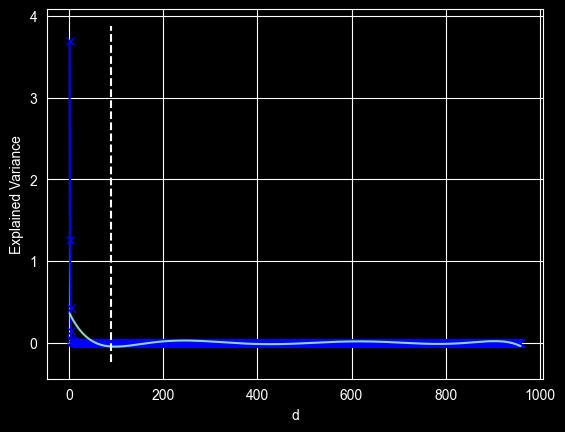

  0%|          | 0/100 [00:00<?, ?it/s]

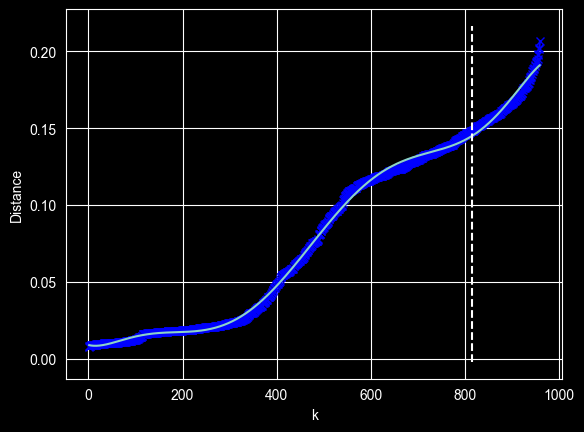

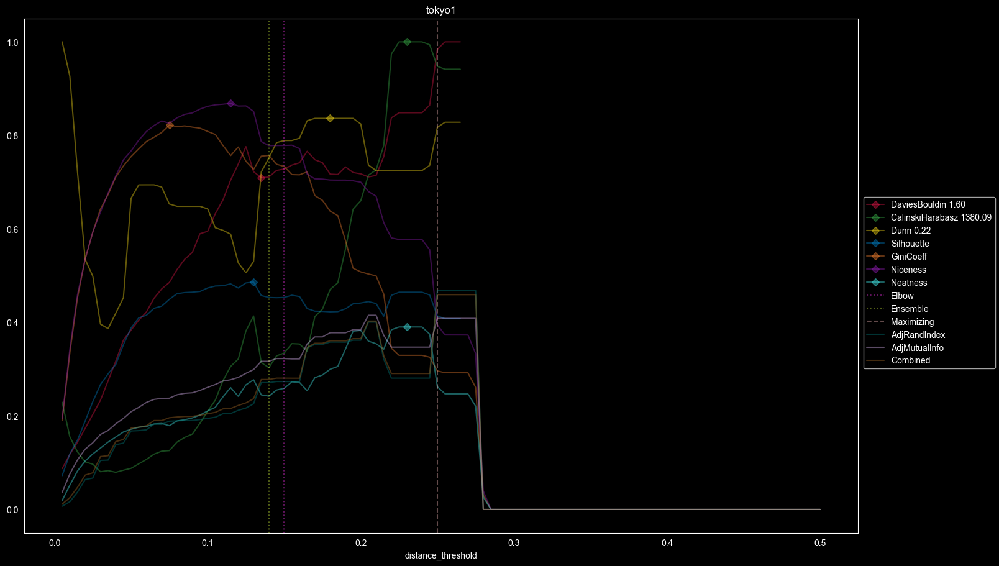

{'Silhouette': 0.4078333297685654, 'Niceness': 0.37313134542006177, 'GiniCoeff': 0.29229525862068967, 'Neatness': 0.2472083968844234, 'sample': {'distance_threshold': 0.25, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {217: 1, 742: 1}, 'DaviesBouldin': 1.598376451051455, 'CalinskiHarabasz': 1299.2609864788458, 'Dunn': 0.17959271793193785, 'AdjRandIndex': 0.46813161453635177, 'AdjMutualInfo': 0.4086319445671108, 'Combined': 0.4592868090705578}
1    613
0    346
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.316801      0.271194  0.277974
CalinskiHarabasz       0.347124      0.280858  0.290708
Dunn                   0.377897      0.357869  0.360846
Silhouette             0.299152      0.225931  0.236816
GiniCoeff              0.237865      0.188793  0.196088
Niceness               0.277373      0.205110  0

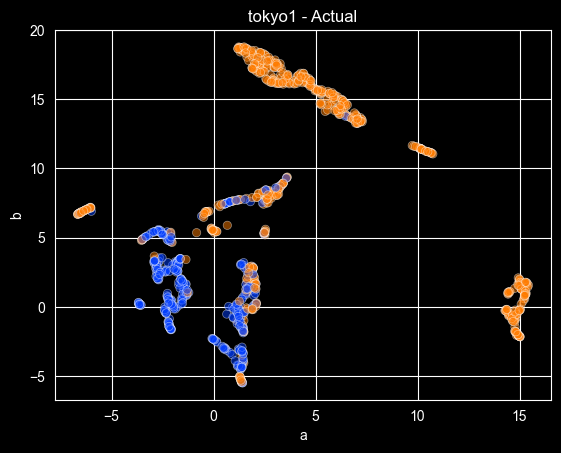

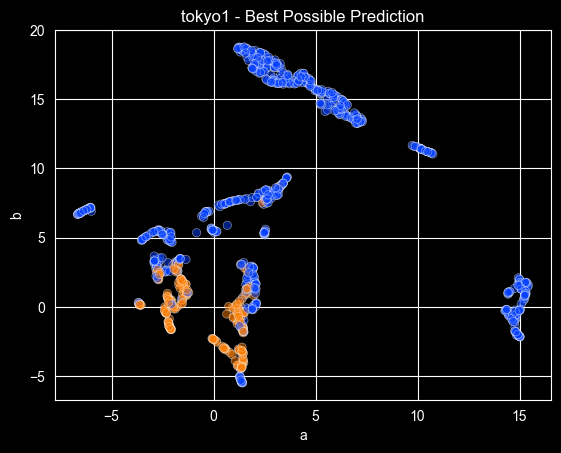

Dataset Summary
n   959.000000
d    44.000000
k     2.000000
e     0.653873
g     0.148653
Name: tokyo1, dtype: float64


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

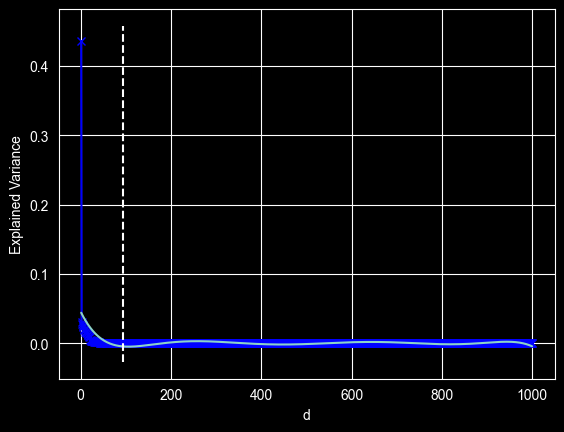

  0%|          | 0/100 [00:00<?, ?it/s]

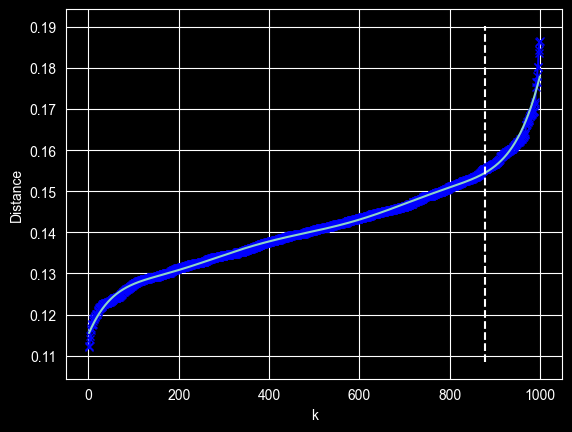

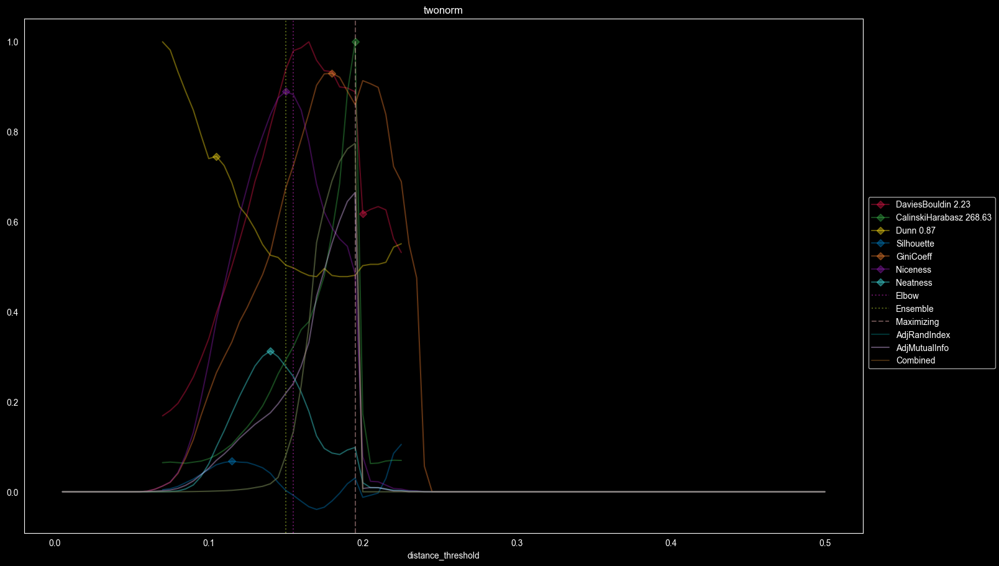

{'Silhouette': 0.03915467306277873, 'Niceness': 0.5390046286738293, 'GiniCoeff': 0.8482004798720342, 'Neatness': 0.11136894423073095, 'sample': {'distance_threshold': 0.195, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 5, 2: 2, 3: 1, 468: 1, 520: 1}, 'DaviesBouldin': 2.074429945786134, 'CalinskiHarabasz': 307.3940635168198, 'Dunn': 0.4156371216471438, 'AdjRandIndex': 0.7742132165256257, 'AdjMutualInfo': 0.6649521358839119, 'Combined': 0.7742132165256257}
0    500
1    500
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.007369      0.000000  0.000000
CalinskiHarabasz       0.664952      0.774213  0.774213
Dunn                   0.069933      0.001709  0.001709
Silhouette             0.100409      0.003162  0.003162
GiniCoeff              0.552198      0.690816  0.690816
Niceness               0.218921 

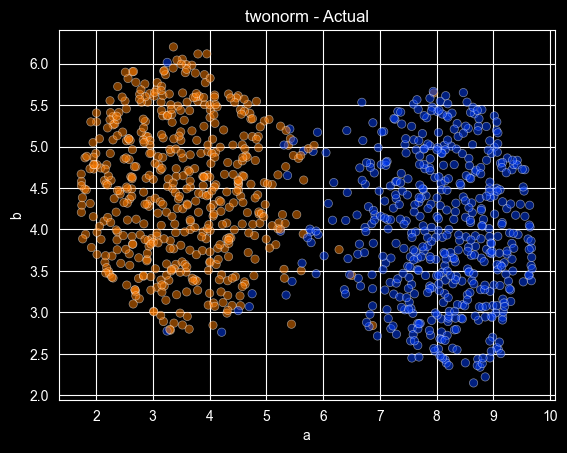

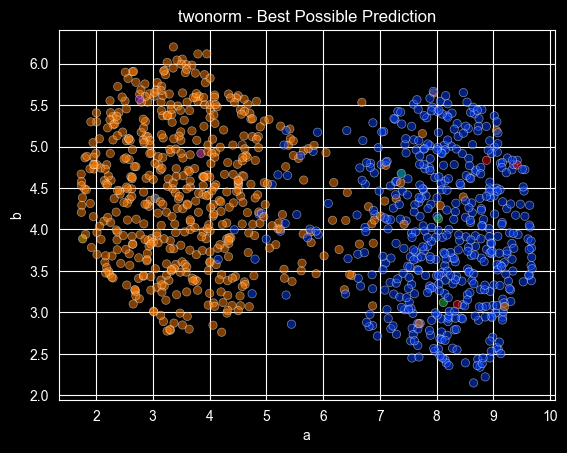

Dataset Summary
n   1000.000000
d     20.000000
k      2.000000
e      0.693147
g      0.000000
Name: twonorm, dtype: float64


  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

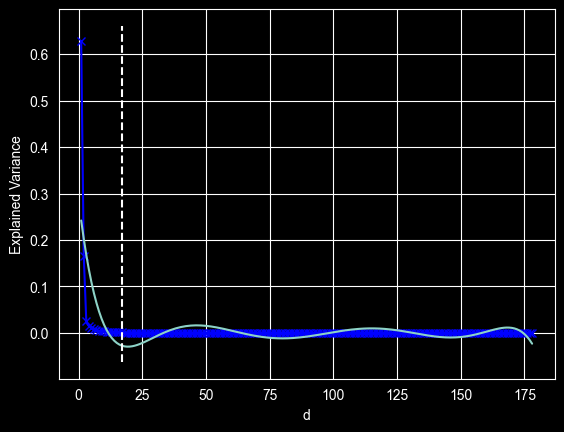

  0%|          | 0/100 [00:00<?, ?it/s]

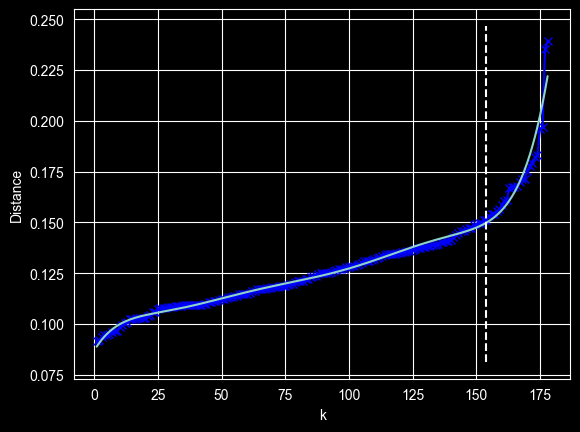

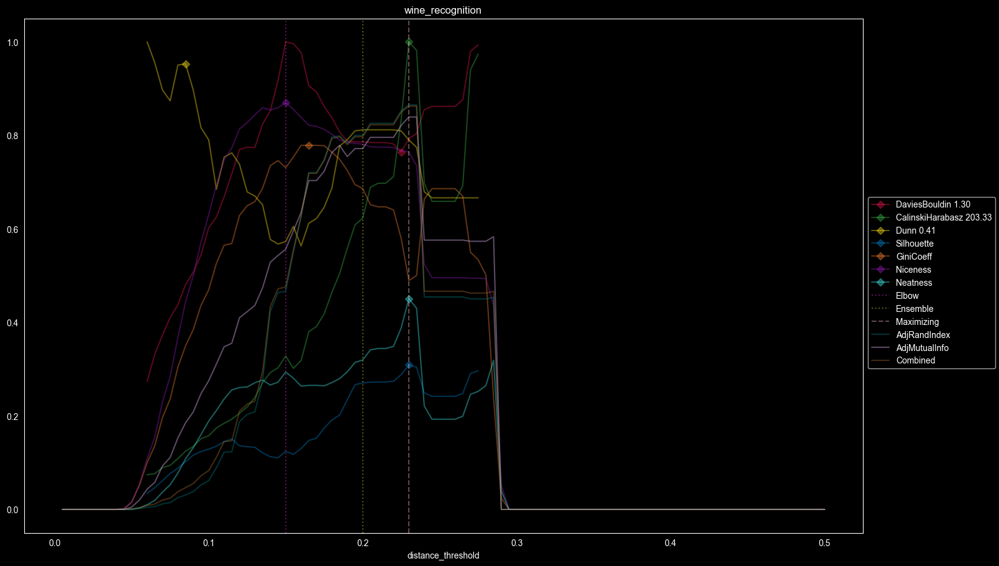

{'Silhouette': 0.3115524014498681, 'Niceness': 0.7639555174228954, 'GiniCoeff': 0.477979797979798, 'Neatness': 0.45874794703543353, 'sample': {'distance_threshold': 0.23, 'linkage': 'average', 'n_clusters': None}, 'counts_dict': {1: 2, 53: 1, 61: 1, 62: 1}, 'DaviesBouldin': 1.0332821878296703, 'CalinskiHarabasz': 207.5470918496055, 'Dunn': 0.3235339555455477, 'AdjRandIndex': 0.8651168482162414, 'AdjMutualInfo': 0.8393073258750644, 'Combined': 0.862518515832399}
2    71
1    59
3    48
Name: count, dtype: int64
                  AdjMutualInfo  AdjRandIndex  Combined
Metric                                                 
BIC                    0.000000      0.000000  0.000000
DaviesBouldin          0.821259      0.852665  0.849503
CalinskiHarabasz       0.839307      0.865117  0.862519
Dunn                   0.185496      0.031097  0.046641
Silhouette             0.839307      0.865117  0.862519
GiniCoeff              0.703420      0.720571  0.718845
Niceness               0.556431     

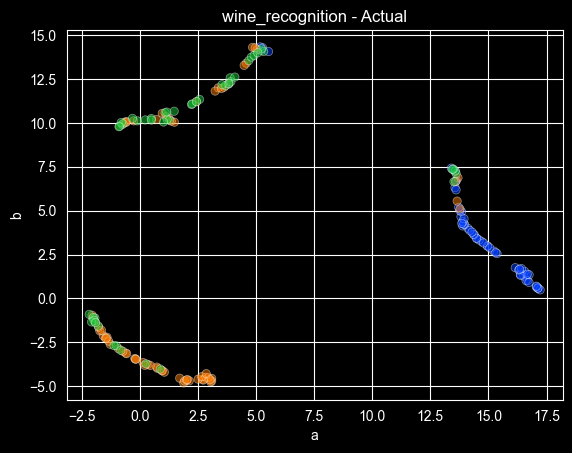

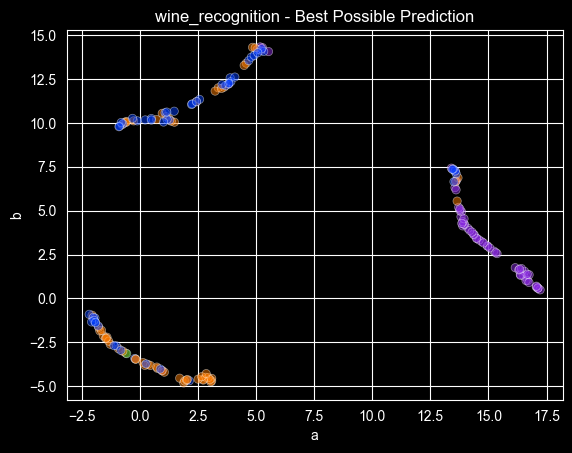

Dataset Summary
n   178.000000
d    13.000000
k     3.000000
e     1.086038
g     0.100673
Name: wine_recognition, dtype: float64


In [2]:
# https://github.com/EpistasisLab/pmlb/issues/167
# deprecated = [
#     "cmc",
#     "195_auto_price",
#     "207_autoPrice",
#     "glass",
#     "heart_c",
#     "cleve",
#     "cleveland_nominal",
#     "heart_statlog",
#     "heart_h",
#     "colic",
#     "vote",
#     "wdbc",
#     "australian",
#     "buggyCrx",
#     "crx",
#     "breast_w",
#     "pima",
#     "german",
#     "flare",
#     "car_evaluation",
#     "kr_vs_kp",
#     "294_satellite_image",
#     "197_cpu_act",
#     "227_cpu_small",
#     "562_cpu_small",
#     "1595_poker",
# ]

classification_dataset_names = [
    "agaricus_lepiota",
    "analcatdata_authorship",
    "breast",
    "breast_cancer_wisconsin",
    "collins",
    "confidence",
    "dermatology",
    "ecoli",
    "house_votes_84",
    "iris",
    "kddcup",
    "mfeat_factors",
    "mfeat_fourier",
    "mfeat_karhunen",
    "mfeat_morphological",
    "mfeat_pixel",
    "new_thyroid",
    "optdigits",
    "pendigits",
    "penguins",
    "ring",
    "satimage",
    "segmentation",
    "soybean",
    "texture",
    "tokyo1",
    'twonorm',
    "wine_recognition",
]

max_size = 1000

max_muti = 0
max_rand = 0
max_combo = 0
results = 0
ranks = 0
d = {}
r = {}

for classification_dataset in classification_dataset_names:
    X, y = fetch_data(
        classification_dataset, return_X_y=True, local_cache_dir="/Users/temp/pmlb_data"
    )
    if len(X) > max_size:
        _, X, _, y = train_test_split(X, y, test_size=max_size, random_state=42, stratify=y)
    X = pd.DataFrame(X)
    y = pd.Series(y)
    if X.shape[1] > 2:
        vis = pd.DataFrame(
            umap.UMAP(random_state=42).fit_transform(X), columns=list("ab"), index=X.index
        )
    elif X.shape[1] == 2:
        vis = X.copy()
        vis.columns = list("ab")
    else:
        vis = X.copy()
        vis.columns = ["a"]
        vis["b"] = 0.0
    kwargs = dict(
        df=X,
        title=f"{classification_dataset}",
        actual=y,
    )
    if "precomputed" in inspect.getfullargspec(optimize).args:
        kwargs["precomputed"] = True
        kwargs["chunksize"] = 20
    clusters, (score, res) = optimize(**kwargs)
    print(res)
    plt.title(f"{classification_dataset} - Actual")
    scatterplot(vis, x="a", y="b", hue=y, alpha=0.5, palette="bright", legend=False)
    plt.show()
    plt.title(f"{classification_dataset} - Best Possible Prediction")
    scatterplot(vis, x="a", y="b", hue=clusters, alpha=0.5, palette="bright", legend=False)
    plt.show()
    rank = res.rank(ascending=False)
    max_muti += res.max_muti
    max_rand += res.max_rand
    max_combo += res.max_combo
    results += res
    ranks += rank
    res = res.Combined
    res["n"], res["d"] = X.shape
    res["k"] = len(np.unique(y))
    _, counts = np.unique(y, return_counts=True)
    res["e"] = entropy(counts)
    res["g"] = gini_coefficient(counts)
    res.name = classification_dataset
    d[classification_dataset] = res
    res.index.name = "Dataset Summary"
    print(res[["n", "d", "k", "e", "g"]])
    res.index.name = "Metric"
    rank = rank.Combined
    rank["n"], rank["d"], rank["k"], rank["e"], rank["g"] = res[["n", "d", "k", "e", "g"]]
    r[classification_dataset] = rank

denom = len(classification_dataset_names)

max_muti /= denom
max_rand /= denom
max_combo /= denom
results /= denom
ranks /= denom
df = pd.DataFrame(d).T
df_rank = pd.DataFrame(r).T

# Results

In [3]:
print("Average Mutual Information:", max_muti)
print("Average Rand Index:", max_rand)
print("Average Combined:", max_combo)

Average Mutual Information: 0.6789160056778222
Average Rand Index: 0.6487558425187193
Average Combined: 0.6486934582030299


### Results across all datasets
- Averages per metric broken down by Mutual Information, Rand Index, and Combined
- Summary statistics
- Correlation matrix
- Mann-Whitney U test

### Raw Scores

In [4]:
results

,AdjMutualInfo,AdjRandIndex,Combined
Metric,,,
BIC,0.000000,0.000000,0.000000
DaviesBouldin,0.508617,0.438700,0.444159
CalinskiHarabasz,0.580536,0.482003,0.488158
Dunn,0.341167,0.271244,0.277127
Silhouette,0.557946,0.461638,0.464637
GiniCoeff,0.527932,0.450018,0.453962
Niceness,0.543266,0.418433,0.433717
Neatness,0.586161,0.479369,0.490158
Elbow,0.561248,0.463060,0.471131


In [5]:
df.describe()

Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,0.000000,0.444159,0.488158,0.277127,0.464637,0.453962,0.433717,0.490158,0.471131,0.515085,725.142857,42.178571,6.535714,1.543618,0.144173
std,0.000000,0.270162,0.236071,0.296231,0.267712,0.219262,0.187383,0.229841,0.159887,0.197630,336.290518,56.517486,4.307462,0.715935,0.195110
min,0.000000,0.000000,0.063574,0.000437,0.003162,0.002895,0.080221,0.017765,0.134550,0.080221,72.000000,3.000000,2.000000,0.644154,0.000000
25%,0.000000,0.254371,0.301608,0.028734,0.203236,0.351304,0.331647,0.353885,0.354040,0.402097,417.750000,12.250000,2.750000,0.789399,0.000000
50%,0.000000,0.473986,0.457799,0.112544,0.511361,0.516202,0.441972,0.504933,0.495580,0.530926,979.500000,22.500000,6.000000,1.545430,0.061001
75%,0.000000,0.663839,0.658857,0.518946,0.681713,0.588858,0.583519,0.626228,0.577525,0.661274,1000.000000,41.750000,10.000000,2.302585,0.226015
max,0.000000,0.937141,0.909557,0.963614,0.909557,0.786595,0.815819,0.909557,0.693179,0.960302,1000.000000,240.000000,18.000000,2.625593,0.831584


In [6]:
df.corr()

Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
Metric,,,,,,,,,,,,,,,
BIC,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DaviesBouldin,NaN,1.000000,0.633791,0.177460,0.820439,0.461686,0.387403,0.702855,0.618776,0.788311,-0.300987,0.058014,-0.147168,-0.177597,0.431830
CalinskiHarabasz,NaN,0.633791,1.000000,0.364856,0.648722,0.717464,-0.010702,0.461649,0.256058,0.515765,-0.489790,-0.185578,-0.358525,-0.481825,0.492267
Dunn,NaN,0.177460,0.364856,1.000000,0.087996,0.199300,0.117443,0.198783,0.212569,0.406307,-0.104270,-0.172066,-0.074822,-0.250216,0.425621
Silhouette,NaN,0.820439,0.648722,0.087996,1.000000,0.457605,0.259073,0.641381,0.522065,0.714812,-0.296372,0.192508,-0.178005,-0.195572,0.430923
GiniCoeff,NaN,0.461686,0.717464,0.199300,0.457605,1.000000,0.245921,0.313899,0.350154,0.356732,-0.376014,-0.246094,-0.029590,-0.147947,0.475533
Niceness,NaN,0.387403,-0.010702,0.117443,0.259073,0.245921,1.000000,0.555681,0.801280,0.602555,0.094465,0.259691,0.608734,0.551553,0.222870
Neatness,NaN,0.702855,0.461649,0.198783,0.641381,0.313899,0.555681,1.000000,0.593831,0.813343,-0.278086,0.216134,0.182695,0.127779,0.372745
Elbow,NaN,0.618776,0.256058,0.212569,0.522065,0.350154,0.801280,0.593831,1.000000,0.803944,-0.090159,0.349391,0.379698,0.389555,0.223008


In [7]:
columns = df.columns[:-5]
pd.DataFrame([[mannwhitneyu(df[x], df[y]).pvalue for x in columns]
              for y in columns], index=columns, columns=columns)

Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble
Metric,,,,,,,,,,
BIC,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DaviesBouldin,0.000000,1.000000,0.512156,0.039730,0.676036,0.761755,0.837701,0.555233,0.700170,0.341866
CalinskiHarabasz,0.000000,0.512156,1.000000,0.004353,0.767995,0.617217,0.412583,0.908660,0.793172,0.611453
Dunn,0.000000,0.039730,0.004353,1.000000,0.005207,0.015296,0.014292,0.003825,0.003825,0.001319
Silhouette,0.000000,0.676036,0.767995,0.005207,1.000000,0.676046,0.496470,0.921671,0.882750,0.664095
GiniCoeff,0.000000,0.761755,0.617217,0.015296,0.676046,1.000000,0.496470,0.688069,0.947737,0.528096
Niceness,0.000000,0.837701,0.412583,0.014292,0.496470,0.496470,1.000000,0.317481,0.421993,0.146979
Neatness,0.000000,0.555233,0.908660,0.003825,0.921671,0.688069,0.317481,1.000000,0.768018,0.724591
Elbow,0.000000,0.700170,0.793172,0.003825,0.882750,0.947737,0.421993,0.768018,1.000000,0.486123


### Ranks

In [8]:
ranks

,AdjMutualInfo,AdjRandIndex,Combined
Metric,,,
BIC,9.982143,9.982143,9.982143
DaviesBouldin,5.392857,5.178571,5.214286
CalinskiHarabasz,4.696429,4.625000,4.625000
Dunn,6.839286,6.696429,6.660714
Silhouette,4.482143,4.589286,4.589286
GiniCoeff,5.571429,5.464286,5.571429
Niceness,5.196429,5.125000,5.125000
Neatness,3.946429,4.375000,4.339286
Elbow,4.589286,4.696429,4.589286


In [9]:
df_rank.describe()

Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,9.982143,5.214286,4.625000,6.660714,4.589286,5.571429,5.125000,4.339286,4.589286,4.303571,725.142857,42.178571,6.535714,1.543618,0.144173
std,0.094491,2.619120,2.602082,3.040022,2.818765,2.222421,2.727178,2.600048,2.252791,1.149390,336.290518,56.517486,4.307462,0.715935,0.195110
min,9.500000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.500000,72.000000,3.000000,2.000000,0.644154,0.000000
25%,10.000000,3.000000,2.000000,3.750000,2.000000,3.875000,2.750000,2.000000,3.000000,3.875000,417.750000,12.250000,2.750000,0.789399,0.000000
50%,10.000000,5.000000,5.000000,8.500000,4.500000,5.500000,5.500000,3.500000,4.500000,4.500000,979.500000,22.500000,6.000000,1.545430,0.061001
75%,10.000000,7.125000,7.000000,9.000000,7.000000,8.000000,7.625000,6.125000,6.000000,5.000000,1000.000000,41.750000,10.000000,2.302585,0.226015
max,10.000000,9.500000,8.500000,9.000000,9.000000,9.000000,9.000000,9.000000,9.000000,6.000000,1000.000000,240.000000,18.000000,2.625593,0.831584


In [10]:
df_rank.corr()

Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble,n,d,k,e,g
Metric,,,,,,,,,,,,,,,
BIC,1.000000,-0.320688,-0.103561,0.332697,-0.167611,-0.214161,0.080845,-0.049802,0.138260,0.478035,-0.160180,-0.075669,-0.157619,-0.207761,0.144816
DaviesBouldin,-0.320688,1.000000,0.042117,-0.133568,0.263200,-0.503805,-0.348706,0.014762,-0.362728,-0.160819,0.130887,0.076420,0.163442,0.196642,-0.327835
CalinskiHarabasz,-0.103561,0.042117,1.000000,0.272438,0.095627,-0.070450,-0.687300,-0.144729,-0.450568,-0.328940,0.434978,0.410727,0.666251,0.810282,-0.266057
Dunn,0.332697,-0.133568,0.272438,1.000000,-0.412342,-0.185407,-0.321925,-0.184041,-0.318542,0.189564,-0.084598,0.087885,0.117630,0.228157,-0.187189
Silhouette,-0.167611,0.263200,0.095627,-0.412342,1.000000,-0.086783,-0.430305,-0.147049,-0.164613,-0.320189,0.109446,-0.181442,0.293328,0.173256,-0.009876
GiniCoeff,-0.214161,-0.503805,-0.070450,-0.185407,-0.086783,1.000000,0.268874,-0.329635,0.207660,-0.204542,0.121299,0.307442,-0.127950,-0.123440,0.018498
Niceness,0.080845,-0.348706,-0.687300,-0.321925,-0.430305,0.268874,1.000000,0.125685,0.478881,0.135141,-0.302294,-0.104677,-0.655396,-0.678724,0.276918
Neatness,-0.049802,0.014762,-0.144729,-0.184041,-0.147049,-0.329635,0.125685,1.000000,-0.338910,-0.113200,0.140191,-0.131111,-0.221864,-0.166028,-0.097209
Elbow,0.138260,-0.362728,-0.450568,-0.318542,-0.164613,0.207660,0.478881,-0.338910,1.000000,0.350313,-0.410969,-0.331311,-0.201674,-0.376438,0.571875


In [11]:
pd.DataFrame([[mannwhitneyu(df_rank[x], df_rank[y]).pvalue for x in columns]
              for y in columns], index=columns, columns=columns)


Metric,BIC,DaviesBouldin,CalinskiHarabasz,Dunn,Silhouette,GiniCoeff,Niceness,Neatness,Elbow,Ensemble
Metric,,,,,,,,,,
BIC,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DaviesBouldin,0.000000,1.000000,0.379206,0.046676,0.344106,0.609990,0.908371,0.185846,0.401207,0.248377
CalinskiHarabasz,0.000000,0.379206,1.000000,0.002375,0.980290,0.113861,0.531709,0.830682,0.901789,0.493554
Dunn,0.000000,0.046676,0.002375,1.000000,0.004848,0.038006,0.010149,0.002297,0.002976,0.001839
Silhouette,0.000000,0.344106,0.980290,0.004848,1.000000,0.117784,0.547928,0.869305,0.993432,0.875576
GiniCoeff,0.000000,0.609990,0.113861,0.038006,0.117784,1.000000,0.603626,0.064321,0.094683,0.062152
Niceness,0.000000,0.908371,0.531709,0.010149,0.547928,0.603626,1.000000,0.361531,0.360753,0.139763
Neatness,0.000000,0.185846,0.830682,0.002297,0.869305,0.064321,0.361531,1.000000,0.587222,0.650302
Elbow,0.000000,0.401207,0.901789,0.002976,0.993432,0.094683,0.360753,0.587222,1.000000,0.530894
